In [1]:
import matplotlib
import matplotlib.pyplot as plt
import matplotlib.style as style
import numpy as np
import pandas as pd
import plotly.express as px
import seaborn as sns
from scipy import stats
import warnings
warnings.filterwarnings("ignore")

In [2]:
from lightgbm import LGBMClassifier
from sklearn import metrics
from sklearn import model_selection
from sklearn import preprocessing
from sklearn.datasets import make_classification
from sklearn.ensemble import ExtraTreesRegressor
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import RandomForestRegressor
from sklearn.linear_model import LogisticRegression
from sklearn.linear_model import Ridge
from sklearn.metrics import accuracy_score
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.metrics import mean_squared_error
from sklearn.metrics import mean_squared_error, mean_absolute_error
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import train_test_split
from sklearn.naive_bayes import GaussianNB
from sklearn.neighbors import KNeighborsClassifier
from sklearn.neighbors import KNeighborsRegressor
from sklearn.preprocessing import StandardScaler, Normalizer
from sklearn.tree import DecisionTreeClassifier
from sklearn.tree import DecisionTreeRegressor
from xgboost import XGBClassifier
from xgboost.sklearn import XGBRegressor
from catboost import CatBoostRegressor
from sklearn.ensemble import GradientBoostingRegressor,AdaBoostRegressor,BaggingRegressor, RandomForestRegressor
from sklearn.neural_network import MLPRegressor
import xgboost as xgb

# I. DATA SET AND PREPROCESSING

In [161]:
data = pd.read_csv("atprice (2).csv", sep=';', encoding='ISO-8859-1')

In [203]:
data.isnull().sum()

model           0
transmission    0
fuelType        0
year            0
milage          0
price           0
dtype: int64

In [167]:
data.tail(3)

,model,transmission,fuelType,year,milage,price
129318,Volkswagen Golf 2.0 TDI,Manual,Diesel,2016,206000,13700
129319,Volkswagen Golf 2.0 TDI,Manual,Diesel,2016,80000,33000
129320,Volkswagen Golf 2.0 TDI,Manual,Diesel,2014,104000,12500


In [164]:
data = data[['model', 'transmission', 'fuelType', "productionDate",'milage','priceEuro']]
data = data.rename(columns={"productionDate": "year", "priceEuro":"price"})

In [165]:
print("Shape of train data Before dropping any Row: ",data.shape)
data = data[data['transmission'].notna()]
print("Shape of train data After dropping Rows with NULL values in Mileage: ",data.shape)
data = data[data['fuelType'].notna()]
print("Shape of train data After dropping Rows with NULL values in Engine : ",data.shape)
data = data.reset_index(drop=True)
print(data.shape)

Shape of train data Before dropping any Row:  (155178, 6)
Shape of train data After dropping Rows with NULL values in Mileage:  (133044, 6)
Shape of train data After dropping Rows with NULL values in Engine :  (129321, 6)
(129321, 6)


In [166]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 129321 entries, 0 to 129320
Data columns (total 6 columns):
 #   Column        Non-Null Count   Dtype 
---  ------        --------------   ----- 
 0   model         129321 non-null  object
 1   transmission  129321 non-null  object
 2   fuelType      129321 non-null  object
 3   year          129321 non-null  int64 
 4   milage        129321 non-null  int64 
 5   price         129321 non-null  int64 
dtypes: int64(3), object(3)
memory usage: 5.9+ MB


In [169]:
test = data[['milage',"price"]]
z = np.abs(stats.zscore(test))
outliers = np.where(z > 3)
data = data.drop(data.index[outliers[0]])
data = data.reset_index(drop=True)
print(data.shape)

(125874, 6)


<AxesSubplot: >

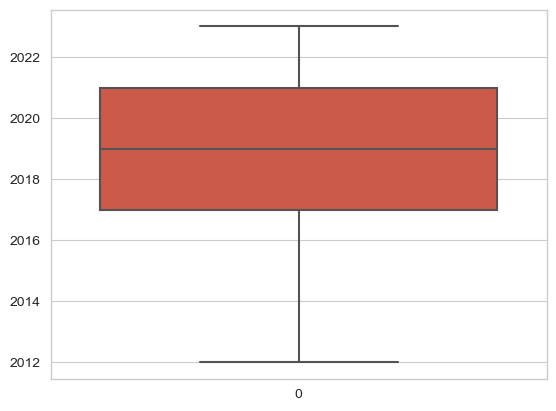

In [192]:
sns.boxplot(data['year'])

In [191]:
data = data[data['year'] > 2011].reset_index(drop=True)

<AxesSubplot: >

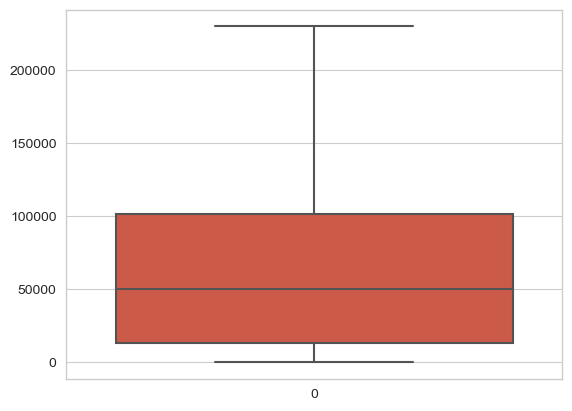

In [188]:
sns.boxplot(data['milage'])

In [187]:
data = data[data['milage'] < 230000].reset_index(drop=True)

In [189]:
data.shape

(112856, 6)

In [193]:
data["transmission"].value_counts()

Automatic         65973
Manual            41105
Semi Automatic      648
Name: transmission, dtype: int64

In [194]:
data['fuelType'].value_counts()

Diesel      61421
Petrol      37606
Electric     4482
Hybrid       4217
Name: fuelType, dtype: int64

In [175]:
data = data[data['fuelType'] != "Ethanol"].reset_index(drop=True)
print(data.shape)
data = data[data['fuelType'] != "LPG"].reset_index(drop=True)
print(data.shape)
data = data[data['fuelType'] != "CNG"].reset_index(drop=True)
print(data.shape)

(121183, 6)
(121154, 6)
(121119, 6)


In [197]:
data['model'].value_counts()

Volkswagen Golf 1.6 TDI      1505
Mercedes Benz C-Class        1062
Audi A4 2.0 TDI               986
Bmw 3 Series 320d             848
Volkswagen Passat 2.0 TDI     828
                             ... 
Seat Ibiza 1.6                 11
Opel Antara 2.2 cdti           11
Volvo V60 Cross Country        11
Hyundai Ioniq 1.6 Plug-In      11
Peugeot 108                    11
Name: model, Length: 1297, dtype: int64

In [196]:
counts = data['model'].value_counts()
to_keep = counts[counts > 10].index
print(data.shape)
data = data[data['model'].isin(to_keep)]
print(data.shape)


(107726, 6)
(107161, 6)


# II. EXPLORATORY DATA ANALYSIS


Skewness: 1.482127
Kurtosis: 2.620375


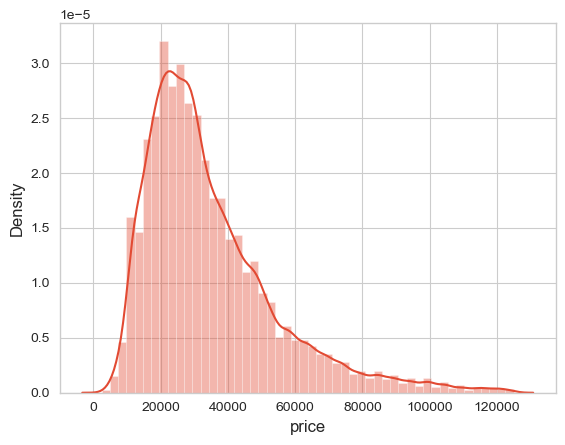

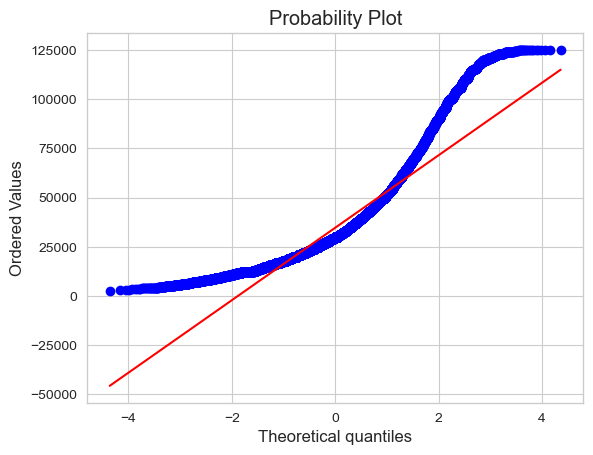

In [199]:
sns.distplot(data['price'])

print("Skewness: %f" % data['price'].skew())
print("Kurtosis: %f" % data['price'].kurt())

fig = plt.figure()
res = stats.probplot(data['price'], plot=plt)

# RELATIONSHIP OF PRICE WITH OTHER PARAMETER

In [200]:
print("Find most important features relative to Price-target")
corr = data.corr()
corr.sort_values(["price"], ascending = False, inplace = True)
print(corr.price)

Find most important features relative to Price-target
price     1.000000
year      0.446536
milage   -0.394132
Name: price, dtype: float64


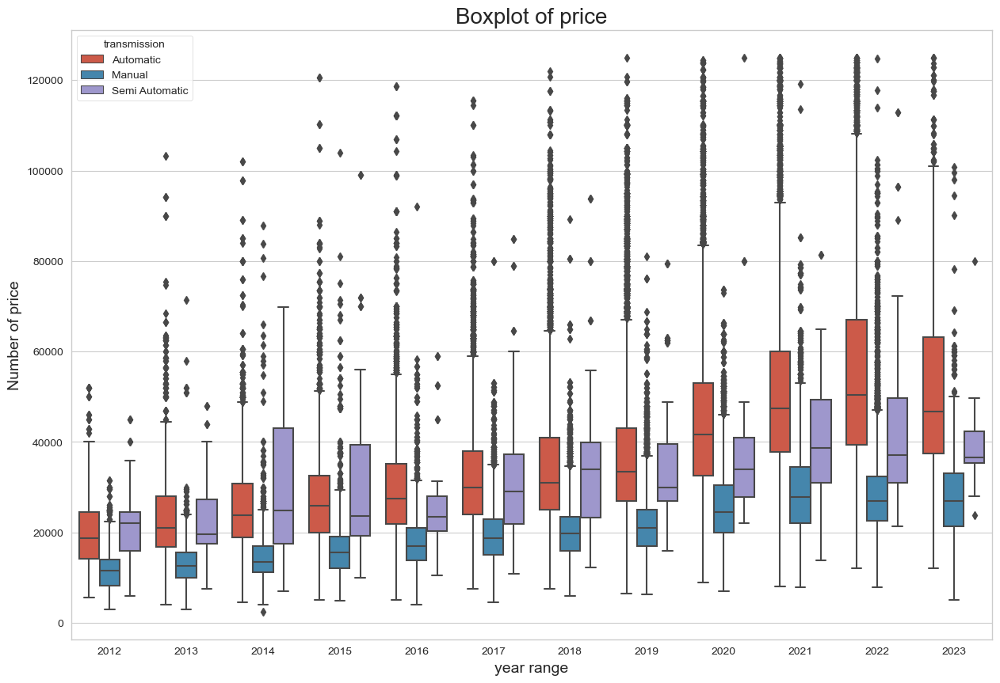

In [201]:
plt.figure(figsize=(15,10))
xprop = 'year'
yprop = 'price'
sns.boxplot(data=data, x=xprop, y=yprop, hue='transmission')
plt.xlabel('{} range'.format(xprop), size=14)
plt.ylabel('Number of {}'.format(yprop), size=14)
plt.title('Boxplot of {}'.format(yprop), size=20)
plt.show()

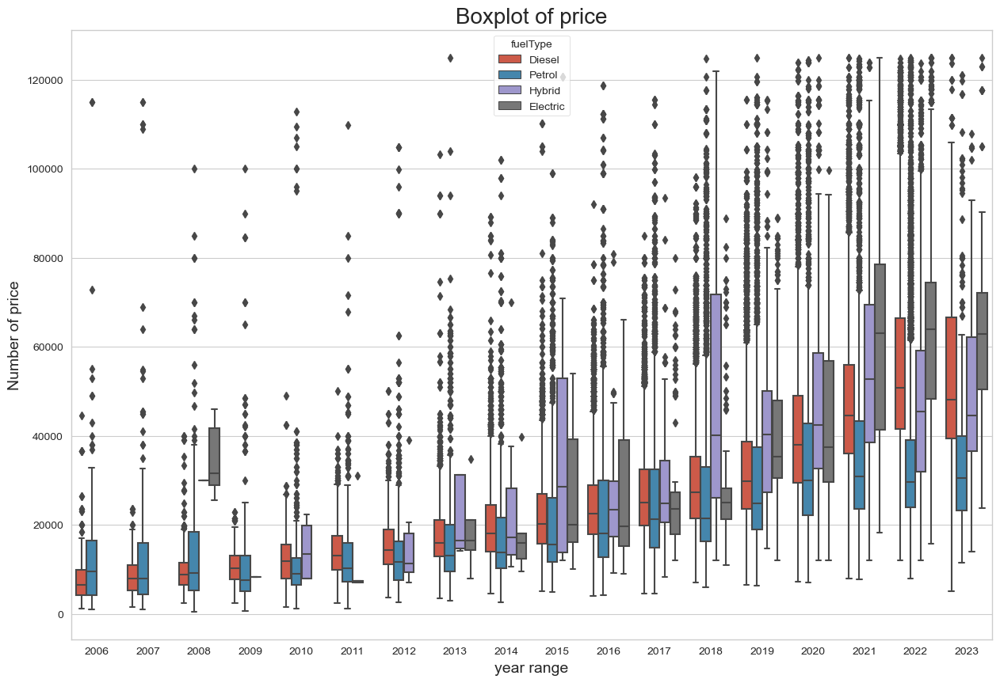

In [181]:
plt.figure(figsize=(15,10))
xprop = 'year'
yprop = 'price'
sns.boxplot(data=data, x=xprop, y=yprop, hue='fuelType')
plt.xlabel('{} range'.format(xprop), size=14)
plt.ylabel('Number of {}'.format(yprop), size=14)
plt.title('Boxplot of {}'.format(yprop), size=20)
plt.show()

In [182]:
fig = px.box(data, x='fuelType',y='price', color='transmission', notched=True)
fig.update_layout(legend=dict(orientation="h",yanchor="bottom",y=1.02,xanchor="right",x=1))
fig.show()

In [183]:
import plotly.graph_objects as go
fig = go.Figure(data=[go.Pie(labels=data['fuelType'], values=data['price'], hole=.3)])
fig.update_layout(legend=dict(orientation="h", yanchor="bottom",y=1.02,xanchor="right",x=1))
fig.show()

## **III. A. Data preparation & Model Parameters**

In [204]:
train_data = data

### Adjusting

In [ ]:
#LabelEncoder
from sklearn.preprocessing import LabelEncoder, StandardScaler
le = LabelEncoder()
train_data['model'] = le.fit_transform(train_data['model'])
train_data['transmission'] = le.fit_transform(train_data['transmission'])
train_data['fuelType'] = le.fit_transform(train_data['fuelType'])


In [210]:
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler()
train_data[['year', 'milage']] = scaler.fit_transform(train_data[['year', 'milage']])


### Here we go

In [215]:
from sklearn.model_selection import cross_val_score

In [214]:
def Definedata():
    data2 = train_data
    X = data2.drop("price", axis=1)
    y = data2['price']
    return X, y


In [217]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn import metrics
import matplotlib.pyplot as plt
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.model_selection import cross_val_score


def Models(models):
    
    model = models
    X, y = Definedata()
    scores = cross_val_score(model, X, y, cv=5)
    print("Cross-validation scores: {}".format(scores))
    print("Cross-validation mean score: {:.2f}".format(scores.mean()))
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.33, random_state = 25)
    model.fit(X_train,y_train)
    y_pred = model.predict(X_test)
    y_total = model.predict(X)
    
    print("\t\tError Table")
    print('Mean Absolute Error      : ', metrics.mean_absolute_error(y_test, y_pred))
    print('Mean Squared  Error      : ', metrics.mean_squared_error(y_test, y_pred))
    print('Root Mean Squared  Error : ', np.sqrt(metrics.mean_squared_error(y_test, y_pred)))
    print('Accuracy on Traing set   : ', model.score(X_train,y_train))
    print('Accuracy on Testing set  : ', model.score(X_test,y_test))
    return y_total, y

def Featureimportances(models):
    model = models
    model.fit(X_train,y_train)
    importances = model.feature_importances_
    features = train_data.columns[:9]
    imp = pd.DataFrame({'Features': ftest, 'Importance': importances})
    imp['Sum Importance'] = imp['Importance'].cumsum()
    imp = imp.sort_values(by = 'Importance')
    return imp

def Graph_prediction(n, y_actual, y_predicted):
    y = y_actual
    y_total = y_predicted
    number = n
    aa=[x for x in range(number)]
    plt.figure(figsize=(25,10)) 
    plt.plot(aa, y[:number], marker='.', label="actual")
    plt.plot(aa, y_total[:number], 'b', label="prediction")
    plt.xlabel('Price prediction of first {} used cars'.format(number), size=15)
    plt.legend(fontsize=15)
    plt.show()



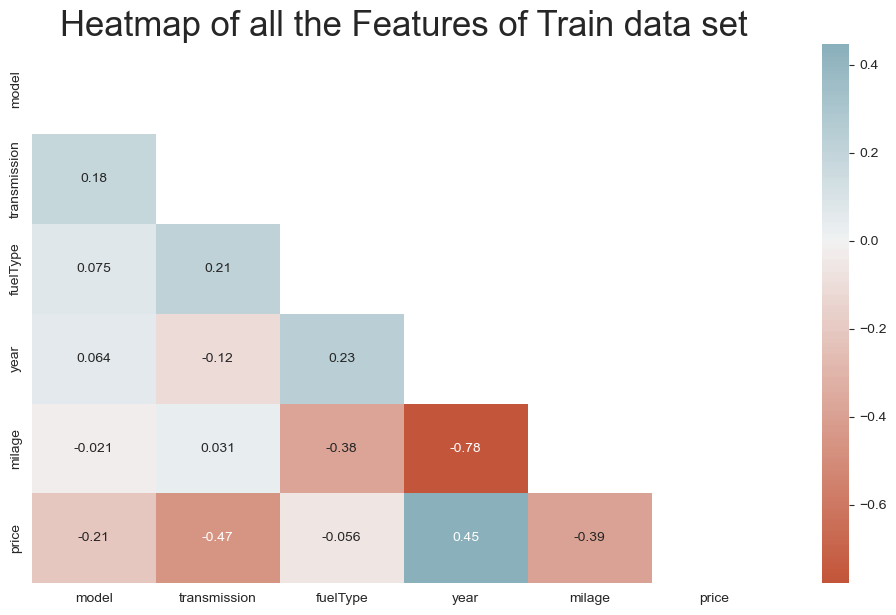

In [216]:
style.use('ggplot')
sns.set_style('whitegrid')
plt.subplots(figsize = (12,7))
mask = np.zeros_like(train_data.corr(), dtype=np.bool)
mask[np.triu_indices_from(mask)] = True
sns.heatmap(train_data.corr(), cmap=sns.diverging_palette(20, 220, n=200), annot=True, mask=mask, center = 0, );
plt.title("Heatmap of all the Features of Train data set", fontsize = 25);

In [218]:
Acc = pd.DataFrame(index=None, columns=['model','Root Mean Squared  Error','Accuracy on Traing set','Accuracy on Testing set'])

In [219]:
X, y = Definedata()
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.33, random_state = 25)
    
regressors = [['DecisionTreeRegressor',DecisionTreeRegressor()],
              ['XGBRegressor', XGBRegressor()],
              ['RandomForestRegressor', RandomForestRegressor()],
              ['MLPRegressor',MLPRegressor()],
              ['AdaBoostRegressor',AdaBoostRegressor()],
              ['ExtraTreesRegressor',ExtraTreesRegressor()]]

for mod in regressors:
    name = mod[0]
    model = mod[1]
    model.fit(X_train,y_train)
    y_pred = model.predict(X_test)
    
    RMSE = np.sqrt(metrics.mean_squared_error(y_test, y_pred))
    ATrS =  model.score(X_train,y_train)
    ATeS = model.score(X_test,y_test)
    
    Acc = Acc.append(pd.Series({'model':name, 'Root Mean Squared  Error': RMSE,'Accuracy on Traing set':ATrS,'Accuracy on Testing set':ATeS}),ignore_index=True )

In [220]:
Acc.sort_values(by='Accuracy on Testing set')

,model,Root Mean Squared Error,Accuracy on Traing set,Accuracy on Testing set
4,AdaBoostRegressor,15622.406417,0.363044,0.358933
3,MLPRegressor,14265.611543,0.466848,0.465450
1,XGBRegressor,6489.485195,0.906433,0.889381
0,DecisionTreeRegressor,5909.428817,0.992247,0.908273
5,ExtraTreesRegressor,5247.920927,0.992247,0.927659
2,RandomForestRegressor,5149.718174,0.984731,0.930341


Cross-validation scores: [0.75053045 0.49970892 0.62056983 0.94605914 0.97050841]
Cross-validation mean score: 0.76
		Error Table
Mean Absolute Error      :  3317.0614936472994
Mean Squared  Error      :  34006029.91825333
Root Mean Squared  Error :  5831.468933146548
Accuracy on Traing set   :  0.9806155103226307
Accuracy on Testing set  :  0.9106770142043437


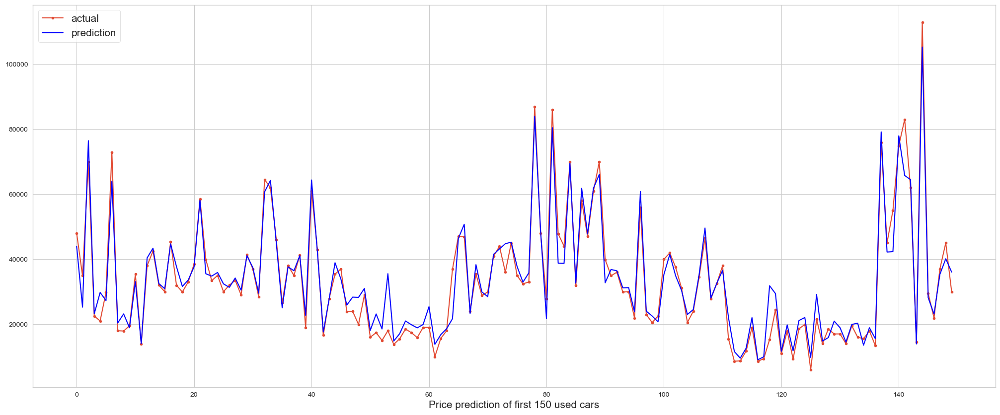

In [221]:
y_predicted, y_actual = Models(RandomForestRegressor(n_estimators=10000,min_samples_split=2,min_samples_leaf=1,max_features='sqrt',max_depth=25))
Graph_prediction(150, y_actual, y_predicted )

		Error Table
Mean Absolute Error      :  4074.7403483155304
Mean Squared  Error      :  40473200.11745184
Root Mean Squared  Error :  6361.855084600076
Accuracy on Traing set   :  0.917772573621767
Accuracy on Testing set  :  0.9003594750259184


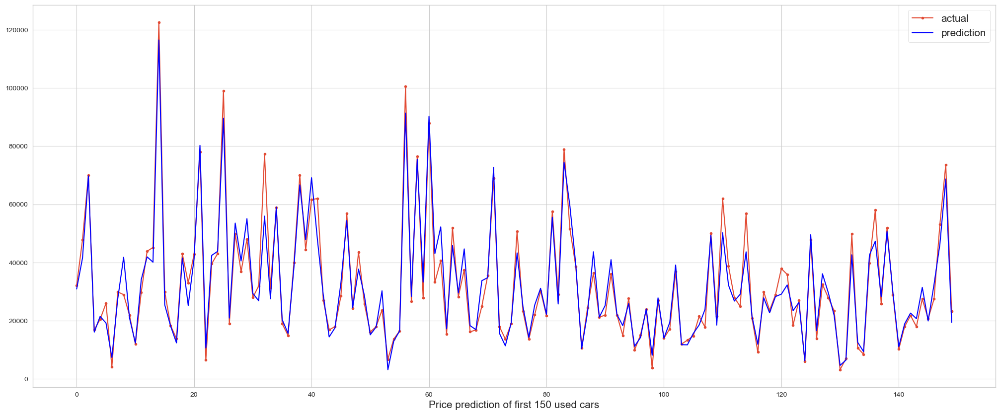

In [132]:
y_predicted, y_actual = Models(GradientBoostingRegressor(random_state=21, n_estimators=3000))
Graph_prediction(150, y_actual, y_predicted)

In [133]:
max(y)

124990

		Error Table
Mean Absolute Error      :  4074.7403483155304
Mean Squared  Error      :  40473200.11745184
Root Mean Squared  Error :  6361.855084600076
Accuracy on Traing set   :  0.917772573621767
Accuracy on Testing set  :  0.9003594750259184


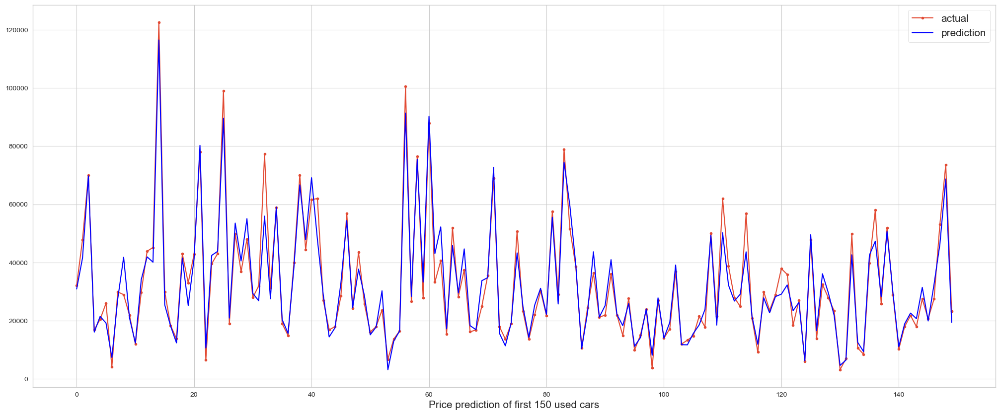

In [134]:
y_predicted, y_actual = Models(GradientBoostingRegressor(random_state=21, n_estimators=3000))
Graph_prediction(150, y_actual, y_predicted)

In [135]:
y_predicted, y_actual = Models(CatBoostRegressor(iterations= 10000, learning_rate= 0.02, random_state= 60))

0:	learn: 19691.7576820	total: 147ms	remaining: 24m 31s
1:	learn: 19500.8347704	total: 152ms	remaining: 12m 41s
2:	learn: 19308.9002900	total: 157ms	remaining: 8m 41s
3:	learn: 19128.8201641	total: 161ms	remaining: 6m 42s
4:	learn: 18950.9213676	total: 165ms	remaining: 5m 29s
5:	learn: 18776.2938502	total: 169ms	remaining: 4m 41s
6:	learn: 18608.6556711	total: 173ms	remaining: 4m 6s
7:	learn: 18449.8670341	total: 177ms	remaining: 3m 41s
8:	learn: 18287.7637915	total: 181ms	remaining: 3m 21s
9:	learn: 18137.6209592	total: 185ms	remaining: 3m 5s
10:	learn: 17986.6112903	total: 189ms	remaining: 2m 51s
11:	learn: 17837.2198350	total: 193ms	remaining: 2m 41s
12:	learn: 17694.1311933	total: 198ms	remaining: 2m 31s
13:	learn: 17556.8327489	total: 202ms	remaining: 2m 24s
14:	learn: 17421.6863795	total: 206ms	remaining: 2m 17s
15:	learn: 17289.5281972	total: 210ms	remaining: 2m 11s
16:	learn: 17161.9423223	total: 215ms	remaining: 2m 6s
17:	learn: 17030.5450324	total: 219ms	remaining: 2m 1s
18:	

176:	learn: 11842.1605383	total: 956ms	remaining: 53s
177:	learn: 11835.5216256	total: 961ms	remaining: 53s
178:	learn: 11824.6120891	total: 967ms	remaining: 53s
179:	learn: 11816.5944470	total: 972ms	remaining: 53.1s
180:	learn: 11807.4447460	total: 978ms	remaining: 53s
181:	learn: 11795.9455807	total: 982ms	remaining: 53s
182:	learn: 11786.9556628	total: 987ms	remaining: 53s
183:	learn: 11780.0498585	total: 992ms	remaining: 52.9s
184:	learn: 11772.9681890	total: 997ms	remaining: 52.9s
185:	learn: 11761.5990705	total: 1s	remaining: 52.8s
186:	learn: 11751.6219442	total: 1.01s	remaining: 52.8s
187:	learn: 11743.8204479	total: 1.01s	remaining: 52.8s
188:	learn: 11734.3645395	total: 1.02s	remaining: 52.7s
189:	learn: 11723.4822337	total: 1.02s	remaining: 52.8s
190:	learn: 11712.6857023	total: 1.03s	remaining: 52.7s
191:	learn: 11702.8900012	total: 1.03s	remaining: 52.7s
192:	learn: 11695.9457367	total: 1.04s	remaining: 52.6s
193:	learn: 11688.2924326	total: 1.04s	remaining: 52.6s
194:	le

345:	learn: 10760.5630406	total: 1.78s	remaining: 49.8s
346:	learn: 10756.8183305	total: 1.79s	remaining: 49.8s
347:	learn: 10753.9366091	total: 1.79s	remaining: 49.7s
348:	learn: 10750.8032463	total: 1.8s	remaining: 49.7s
349:	learn: 10749.4567067	total: 1.8s	remaining: 49.7s
350:	learn: 10745.3475436	total: 1.81s	remaining: 49.7s
351:	learn: 10744.3281108	total: 1.81s	remaining: 49.6s
352:	learn: 10741.6567805	total: 1.81s	remaining: 49.6s
353:	learn: 10737.7979958	total: 1.82s	remaining: 49.6s
354:	learn: 10733.1953314	total: 1.82s	remaining: 49.6s
355:	learn: 10728.3855490	total: 1.83s	remaining: 49.6s
356:	learn: 10725.4734138	total: 1.83s	remaining: 49.6s
357:	learn: 10721.1502592	total: 1.84s	remaining: 49.5s
358:	learn: 10715.1491253	total: 1.84s	remaining: 49.5s
359:	learn: 10707.0865116	total: 1.85s	remaining: 49.5s
360:	learn: 10702.9731539	total: 1.85s	remaining: 49.5s
361:	learn: 10698.9092246	total: 1.86s	remaining: 49.5s
362:	learn: 10694.3560704	total: 1.86s	remaining: 

514:	learn: 10141.8545350	total: 2.58s	remaining: 47.6s
515:	learn: 10140.1857422	total: 2.59s	remaining: 47.6s
516:	learn: 10138.2812602	total: 2.59s	remaining: 47.6s
517:	learn: 10133.2694271	total: 2.6s	remaining: 47.6s
518:	learn: 10126.9214075	total: 2.6s	remaining: 47.5s
519:	learn: 10124.6544165	total: 2.61s	remaining: 47.5s
520:	learn: 10123.8623444	total: 2.61s	remaining: 47.5s
521:	learn: 10117.0205358	total: 2.62s	remaining: 47.5s
522:	learn: 10114.6012629	total: 2.62s	remaining: 47.5s
523:	learn: 10111.8196380	total: 2.63s	remaining: 47.5s
524:	learn: 10109.4951479	total: 2.63s	remaining: 47.5s
525:	learn: 10106.0673868	total: 2.63s	remaining: 47.4s
526:	learn: 10104.0379085	total: 2.64s	remaining: 47.4s
527:	learn: 10102.6524112	total: 2.64s	remaining: 47.4s
528:	learn: 10100.3821579	total: 2.65s	remaining: 47.4s
529:	learn: 10093.6324512	total: 2.65s	remaining: 47.4s
530:	learn: 10086.7912288	total: 2.66s	remaining: 47.4s
531:	learn: 10083.6685878	total: 2.66s	remaining: 

687:	learn: 9649.8389410	total: 3.38s	remaining: 45.8s
688:	learn: 9647.3361539	total: 3.39s	remaining: 45.8s
689:	learn: 9645.0624789	total: 3.39s	remaining: 45.7s
690:	learn: 9643.4306563	total: 3.4s	remaining: 45.7s
691:	learn: 9639.4159115	total: 3.4s	remaining: 45.7s
692:	learn: 9637.9515600	total: 3.4s	remaining: 45.7s
693:	learn: 9635.8933111	total: 3.41s	remaining: 45.7s
694:	learn: 9631.1591269	total: 3.41s	remaining: 45.7s
695:	learn: 9629.6398809	total: 3.42s	remaining: 45.7s
696:	learn: 9628.1676121	total: 3.42s	remaining: 45.7s
697:	learn: 9623.6139741	total: 3.43s	remaining: 45.7s
698:	learn: 9619.0950524	total: 3.43s	remaining: 45.7s
699:	learn: 9615.8453600	total: 3.44s	remaining: 45.7s
700:	learn: 9613.6246039	total: 3.44s	remaining: 45.6s
701:	learn: 9609.2467769	total: 3.44s	remaining: 45.6s
702:	learn: 9606.9192266	total: 3.45s	remaining: 45.6s
703:	learn: 9606.1705066	total: 3.45s	remaining: 45.6s
704:	learn: 9604.5033890	total: 3.46s	remaining: 45.6s
705:	learn: 9

863:	learn: 9279.0413902	total: 4.21s	remaining: 44.5s
864:	learn: 9278.5742860	total: 4.22s	remaining: 44.5s
865:	learn: 9277.6719490	total: 4.22s	remaining: 44.5s
866:	learn: 9275.2403494	total: 4.23s	remaining: 44.5s
867:	learn: 9274.4419987	total: 4.23s	remaining: 44.5s
868:	learn: 9272.7234630	total: 4.24s	remaining: 44.5s
869:	learn: 9271.6467670	total: 4.24s	remaining: 44.5s
870:	learn: 9269.1843411	total: 4.25s	remaining: 44.5s
871:	learn: 9268.3127686	total: 4.25s	remaining: 44.5s
872:	learn: 9266.4448234	total: 4.25s	remaining: 44.5s
873:	learn: 9264.4311397	total: 4.26s	remaining: 44.5s
874:	learn: 9263.3317054	total: 4.26s	remaining: 44.5s
875:	learn: 9261.6741576	total: 4.27s	remaining: 44.5s
876:	learn: 9259.8896550	total: 4.28s	remaining: 44.5s
877:	learn: 9257.7255448	total: 4.28s	remaining: 44.5s
878:	learn: 9256.6413032	total: 4.28s	remaining: 44.5s
879:	learn: 9255.0387409	total: 4.29s	remaining: 44.5s
880:	learn: 9252.1257235	total: 4.29s	remaining: 44.5s
881:	learn

1027:	learn: 9054.9263719	total: 5.02s	remaining: 43.8s
1028:	learn: 9053.6066149	total: 5.03s	remaining: 43.8s
1029:	learn: 9052.0407174	total: 5.03s	remaining: 43.8s
1030:	learn: 9050.9845033	total: 5.04s	remaining: 43.8s
1031:	learn: 9047.9846868	total: 5.04s	remaining: 43.8s
1032:	learn: 9046.2038437	total: 5.05s	remaining: 43.8s
1033:	learn: 9045.8684680	total: 5.05s	remaining: 43.8s
1034:	learn: 9042.7009148	total: 5.06s	remaining: 43.8s
1035:	learn: 9041.4946932	total: 5.07s	remaining: 43.8s
1036:	learn: 9040.9218310	total: 5.07s	remaining: 43.8s
1037:	learn: 9040.0092437	total: 5.08s	remaining: 43.8s
1038:	learn: 9039.0482680	total: 5.08s	remaining: 43.8s
1039:	learn: 9036.0775444	total: 5.09s	remaining: 43.8s
1040:	learn: 9035.1102721	total: 5.09s	remaining: 43.8s
1041:	learn: 9034.4525356	total: 5.1s	remaining: 43.8s
1042:	learn: 9032.5630508	total: 5.1s	remaining: 43.8s
1043:	learn: 9031.7364516	total: 5.11s	remaining: 43.8s
1044:	learn: 9029.9255707	total: 5.11s	remaining: 

1184:	learn: 8848.6875489	total: 5.82s	remaining: 43.3s
1185:	learn: 8847.3768482	total: 5.83s	remaining: 43.3s
1186:	learn: 8847.0332040	total: 5.83s	remaining: 43.3s
1187:	learn: 8846.2320405	total: 5.84s	remaining: 43.3s
1188:	learn: 8845.6497945	total: 5.84s	remaining: 43.3s
1189:	learn: 8844.5587137	total: 5.85s	remaining: 43.3s
1190:	learn: 8843.4274372	total: 5.85s	remaining: 43.3s
1191:	learn: 8842.2436129	total: 5.86s	remaining: 43.3s
1192:	learn: 8839.6470877	total: 5.86s	remaining: 43.3s
1193:	learn: 8837.7020628	total: 5.87s	remaining: 43.3s
1194:	learn: 8836.2880669	total: 5.87s	remaining: 43.3s
1195:	learn: 8834.8613906	total: 5.88s	remaining: 43.3s
1196:	learn: 8834.3692377	total: 5.88s	remaining: 43.3s
1197:	learn: 8833.8236841	total: 5.89s	remaining: 43.3s
1198:	learn: 8833.2384657	total: 5.89s	remaining: 43.3s
1199:	learn: 8832.7366057	total: 5.9s	remaining: 43.3s
1200:	learn: 8831.5421315	total: 5.91s	remaining: 43.3s
1201:	learn: 8830.3357246	total: 5.91s	remaining:

1343:	learn: 8676.1241277	total: 6.64s	remaining: 42.8s
1344:	learn: 8673.7130995	total: 6.65s	remaining: 42.8s
1345:	learn: 8672.1960641	total: 6.66s	remaining: 42.8s
1346:	learn: 8671.4267023	total: 6.66s	remaining: 42.8s
1347:	learn: 8670.4143580	total: 6.67s	remaining: 42.8s
1348:	learn: 8670.0696656	total: 6.67s	remaining: 42.8s
1349:	learn: 8669.0650569	total: 6.68s	remaining: 42.8s
1350:	learn: 8667.9707853	total: 6.68s	remaining: 42.8s
1351:	learn: 8666.6700438	total: 6.69s	remaining: 42.8s
1352:	learn: 8665.6365810	total: 6.69s	remaining: 42.8s
1353:	learn: 8664.2306026	total: 6.7s	remaining: 42.8s
1354:	learn: 8661.2955493	total: 6.7s	remaining: 42.8s
1355:	learn: 8659.7000509	total: 6.71s	remaining: 42.8s
1356:	learn: 8658.6309545	total: 6.71s	remaining: 42.8s
1357:	learn: 8657.5778307	total: 6.72s	remaining: 42.8s
1358:	learn: 8657.1918666	total: 6.72s	remaining: 42.7s
1359:	learn: 8654.3808734	total: 6.73s	remaining: 42.7s
1360:	learn: 8654.0995977	total: 6.73s	remaining: 

1501:	learn: 8517.5795149	total: 7.47s	remaining: 42.3s
1502:	learn: 8517.2443402	total: 7.47s	remaining: 42.2s
1503:	learn: 8516.7145825	total: 7.48s	remaining: 42.2s
1504:	learn: 8516.4138698	total: 7.48s	remaining: 42.2s
1505:	learn: 8516.0081941	total: 7.49s	remaining: 42.2s
1506:	learn: 8515.1522448	total: 7.49s	remaining: 42.2s
1507:	learn: 8514.1081527	total: 7.5s	remaining: 42.2s
1508:	learn: 8513.4336826	total: 7.5s	remaining: 42.2s
1509:	learn: 8511.6080776	total: 7.51s	remaining: 42.2s
1510:	learn: 8510.8501609	total: 7.51s	remaining: 42.2s
1511:	learn: 8510.4558650	total: 7.52s	remaining: 42.2s
1512:	learn: 8508.9833768	total: 7.52s	remaining: 42.2s
1513:	learn: 8508.1163375	total: 7.53s	remaining: 42.2s
1514:	learn: 8506.4779529	total: 7.53s	remaining: 42.2s
1515:	learn: 8505.7302531	total: 7.54s	remaining: 42.2s
1516:	learn: 8505.0950252	total: 7.54s	remaining: 42.2s
1517:	learn: 8504.4484895	total: 7.55s	remaining: 42.2s
1518:	learn: 8503.7025672	total: 7.55s	remaining: 

1655:	learn: 8393.5679299	total: 8.27s	remaining: 41.7s
1656:	learn: 8391.9495964	total: 8.28s	remaining: 41.7s
1657:	learn: 8391.7320774	total: 8.28s	remaining: 41.7s
1658:	learn: 8390.4578739	total: 8.29s	remaining: 41.7s
1659:	learn: 8389.8536263	total: 8.29s	remaining: 41.7s
1660:	learn: 8388.8477869	total: 8.29s	remaining: 41.6s
1661:	learn: 8388.6446678	total: 8.3s	remaining: 41.6s
1662:	learn: 8387.5451597	total: 8.3s	remaining: 41.6s
1663:	learn: 8386.4644843	total: 8.31s	remaining: 41.6s
1664:	learn: 8385.2049986	total: 8.32s	remaining: 41.6s
1665:	learn: 8384.6899813	total: 8.32s	remaining: 41.6s
1666:	learn: 8383.1016016	total: 8.33s	remaining: 41.6s
1667:	learn: 8382.5063560	total: 8.33s	remaining: 41.6s
1668:	learn: 8381.5098854	total: 8.34s	remaining: 41.6s
1669:	learn: 8380.3728549	total: 8.34s	remaining: 41.6s
1670:	learn: 8379.5509869	total: 8.35s	remaining: 41.6s
1671:	learn: 8379.1712076	total: 8.35s	remaining: 41.6s
1672:	learn: 8378.2468536	total: 8.36s	remaining: 

1807:	learn: 8288.2798597	total: 9.06s	remaining: 41s
1808:	learn: 8287.1135299	total: 9.06s	remaining: 41s
1809:	learn: 8286.7289696	total: 9.07s	remaining: 41s
1810:	learn: 8286.5153840	total: 9.07s	remaining: 41s
1811:	learn: 8285.7367769	total: 9.08s	remaining: 41s
1812:	learn: 8284.7440572	total: 9.08s	remaining: 41s
1813:	learn: 8284.4076254	total: 9.09s	remaining: 41s
1814:	learn: 8283.9124552	total: 9.1s	remaining: 41s
1815:	learn: 8283.5727133	total: 9.1s	remaining: 41s
1816:	learn: 8283.2378396	total: 9.11s	remaining: 41s
1817:	learn: 8283.0625217	total: 9.11s	remaining: 41s
1818:	learn: 8282.4304974	total: 9.12s	remaining: 41s
1819:	learn: 8281.7124694	total: 9.12s	remaining: 41s
1820:	learn: 8281.2625583	total: 9.13s	remaining: 41s
1821:	learn: 8280.8406902	total: 9.13s	remaining: 41s
1822:	learn: 8280.2477731	total: 9.13s	remaining: 41s
1823:	learn: 8279.6859331	total: 9.14s	remaining: 41s
1824:	learn: 8278.9164809	total: 9.15s	remaining: 41s
1825:	learn: 8278.4793865	tota

1968:	learn: 8190.3414639	total: 9.89s	remaining: 40.3s
1969:	learn: 8189.7305591	total: 9.89s	remaining: 40.3s
1970:	learn: 8189.3611800	total: 9.9s	remaining: 40.3s
1971:	learn: 8188.6377291	total: 9.9s	remaining: 40.3s
1972:	learn: 8188.1502479	total: 9.91s	remaining: 40.3s
1973:	learn: 8187.9682990	total: 9.92s	remaining: 40.3s
1974:	learn: 8187.3465854	total: 9.92s	remaining: 40.3s
1975:	learn: 8186.7785297	total: 9.93s	remaining: 40.3s
1976:	learn: 8186.2474305	total: 9.93s	remaining: 40.3s
1977:	learn: 8184.3945950	total: 9.94s	remaining: 40.3s
1978:	learn: 8182.7159085	total: 9.94s	remaining: 40.3s
1979:	learn: 8181.4895092	total: 9.95s	remaining: 40.3s
1980:	learn: 8180.1093522	total: 9.96s	remaining: 40.3s
1981:	learn: 8179.5378833	total: 9.96s	remaining: 40.3s
1982:	learn: 8178.6899537	total: 9.97s	remaining: 40.3s
1983:	learn: 8178.0424344	total: 9.97s	remaining: 40.3s
1984:	learn: 8176.9824701	total: 9.98s	remaining: 40.3s
1985:	learn: 8176.5245082	total: 9.98s	remaining: 

2126:	learn: 8097.4108617	total: 10.7s	remaining: 39.6s
2127:	learn: 8097.3179213	total: 10.7s	remaining: 39.6s
2128:	learn: 8096.5817699	total: 10.7s	remaining: 39.6s
2129:	learn: 8096.0412077	total: 10.7s	remaining: 39.6s
2130:	learn: 8095.6712378	total: 10.7s	remaining: 39.6s
2131:	learn: 8095.4550767	total: 10.7s	remaining: 39.6s
2132:	learn: 8094.8303297	total: 10.7s	remaining: 39.6s
2133:	learn: 8094.3980479	total: 10.7s	remaining: 39.6s
2134:	learn: 8093.9915509	total: 10.8s	remaining: 39.6s
2135:	learn: 8093.3399172	total: 10.8s	remaining: 39.6s
2136:	learn: 8093.0918874	total: 10.8s	remaining: 39.6s
2137:	learn: 8092.9573078	total: 10.8s	remaining: 39.6s
2138:	learn: 8092.4681543	total: 10.8s	remaining: 39.6s
2139:	learn: 8091.6269117	total: 10.8s	remaining: 39.6s
2140:	learn: 8091.1402199	total: 10.8s	remaining: 39.6s
2141:	learn: 8090.5635071	total: 10.8s	remaining: 39.6s
2142:	learn: 8089.9072678	total: 10.8s	remaining: 39.6s
2143:	learn: 8089.3155890	total: 10.8s	remaining

2282:	learn: 8017.6600750	total: 11.5s	remaining: 39s
2283:	learn: 8017.1384641	total: 11.5s	remaining: 39s
2284:	learn: 8016.5887668	total: 11.6s	remaining: 39s
2285:	learn: 8015.9476555	total: 11.6s	remaining: 39s
2286:	learn: 8015.2969661	total: 11.6s	remaining: 39s
2287:	learn: 8014.8077571	total: 11.6s	remaining: 39s
2288:	learn: 8014.3205940	total: 11.6s	remaining: 39s
2289:	learn: 8013.9267944	total: 11.6s	remaining: 39s
2290:	learn: 8013.5580405	total: 11.6s	remaining: 39s
2291:	learn: 8013.2029965	total: 11.6s	remaining: 39s
2292:	learn: 8012.5414247	total: 11.6s	remaining: 39s
2293:	learn: 8011.8654236	total: 11.6s	remaining: 39s
2294:	learn: 8011.6106715	total: 11.6s	remaining: 39s
2295:	learn: 8010.9956768	total: 11.6s	remaining: 39s
2296:	learn: 8010.6460663	total: 11.6s	remaining: 39s
2297:	learn: 8010.2776787	total: 11.6s	remaining: 39s
2298:	learn: 8010.1541669	total: 11.6s	remaining: 39s
2299:	learn: 8009.9584567	total: 11.6s	remaining: 38.9s
2300:	learn: 8009.4527177	

2430:	learn: 7946.2204138	total: 12.3s	remaining: 38.4s
2431:	learn: 7945.6617013	total: 12.3s	remaining: 38.4s
2432:	learn: 7945.0381895	total: 12.3s	remaining: 38.4s
2433:	learn: 7944.0507733	total: 12.4s	remaining: 38.4s
2434:	learn: 7943.6416403	total: 12.4s	remaining: 38.4s
2435:	learn: 7943.1085420	total: 12.4s	remaining: 38.4s
2436:	learn: 7942.8078116	total: 12.4s	remaining: 38.4s
2437:	learn: 7942.1429662	total: 12.4s	remaining: 38.4s
2438:	learn: 7941.9725107	total: 12.4s	remaining: 38.4s
2439:	learn: 7941.5982472	total: 12.4s	remaining: 38.4s
2440:	learn: 7941.1767786	total: 12.4s	remaining: 38.4s
2441:	learn: 7940.9953152	total: 12.4s	remaining: 38.4s
2442:	learn: 7940.1143158	total: 12.4s	remaining: 38.4s
2443:	learn: 7939.4336465	total: 12.4s	remaining: 38.4s
2444:	learn: 7939.2670127	total: 12.4s	remaining: 38.4s
2445:	learn: 7938.6774627	total: 12.4s	remaining: 38.4s
2446:	learn: 7938.2714200	total: 12.4s	remaining: 38.4s
2447:	learn: 7937.6064097	total: 12.4s	remaining

2616:	learn: 7868.3477023	total: 13.3s	remaining: 37.6s
2617:	learn: 7867.8410936	total: 13.3s	remaining: 37.6s
2618:	learn: 7867.6814716	total: 13.4s	remaining: 37.7s
2619:	learn: 7867.3245762	total: 13.4s	remaining: 37.7s
2620:	learn: 7866.8892189	total: 13.4s	remaining: 37.7s
2621:	learn: 7866.5119126	total: 13.4s	remaining: 37.6s
2622:	learn: 7866.1027369	total: 13.4s	remaining: 37.6s
2623:	learn: 7865.5365936	total: 13.4s	remaining: 37.6s
2624:	learn: 7865.1939105	total: 13.4s	remaining: 37.6s
2625:	learn: 7864.7606382	total: 13.4s	remaining: 37.6s
2626:	learn: 7864.2809099	total: 13.4s	remaining: 37.6s
2627:	learn: 7864.0529185	total: 13.4s	remaining: 37.6s
2628:	learn: 7863.8262378	total: 13.4s	remaining: 37.6s
2629:	learn: 7863.5275100	total: 13.4s	remaining: 37.6s
2630:	learn: 7863.1028496	total: 13.4s	remaining: 37.6s
2631:	learn: 7862.5802953	total: 13.4s	remaining: 37.6s
2632:	learn: 7862.2626145	total: 13.4s	remaining: 37.6s
2633:	learn: 7862.0473764	total: 13.4s	remaining

2770:	learn: 7808.5525119	total: 14.2s	remaining: 36.9s
2771:	learn: 7808.1904722	total: 14.2s	remaining: 36.9s
2772:	learn: 7807.6863911	total: 14.2s	remaining: 36.9s
2773:	learn: 7807.2135718	total: 14.2s	remaining: 36.9s
2774:	learn: 7806.9886820	total: 14.2s	remaining: 36.9s
2775:	learn: 7806.5453371	total: 14.2s	remaining: 36.9s
2776:	learn: 7806.3790500	total: 14.2s	remaining: 36.9s
2777:	learn: 7806.0270389	total: 14.2s	remaining: 36.9s
2778:	learn: 7805.8662036	total: 14.2s	remaining: 36.9s
2779:	learn: 7805.4358061	total: 14.2s	remaining: 36.9s
2780:	learn: 7804.7587414	total: 14.2s	remaining: 36.9s
2781:	learn: 7804.6330776	total: 14.2s	remaining: 36.9s
2782:	learn: 7804.2156454	total: 14.2s	remaining: 36.9s
2783:	learn: 7803.6249527	total: 14.2s	remaining: 36.9s
2784:	learn: 7803.1502875	total: 14.2s	remaining: 36.9s
2785:	learn: 7802.8284485	total: 14.2s	remaining: 36.8s
2786:	learn: 7802.5460741	total: 14.2s	remaining: 36.8s
2787:	learn: 7802.3680391	total: 14.2s	remaining

2926:	learn: 7750.1307671	total: 15s	remaining: 36.2s
2927:	learn: 7749.5252411	total: 15s	remaining: 36.2s
2928:	learn: 7749.3546066	total: 15s	remaining: 36.2s
2929:	learn: 7748.6527545	total: 15s	remaining: 36.1s
2930:	learn: 7748.1956433	total: 15s	remaining: 36.1s
2931:	learn: 7747.9290124	total: 15s	remaining: 36.1s
2932:	learn: 7747.5266574	total: 15s	remaining: 36.1s
2933:	learn: 7747.2899385	total: 15s	remaining: 36.1s
2934:	learn: 7746.5960954	total: 15s	remaining: 36.1s
2935:	learn: 7746.2877637	total: 15s	remaining: 36.1s
2936:	learn: 7746.1602085	total: 15s	remaining: 36.1s
2937:	learn: 7745.6672998	total: 15s	remaining: 36.1s
2938:	learn: 7744.9513193	total: 15s	remaining: 36.1s
2939:	learn: 7744.7434891	total: 15s	remaining: 36.1s
2940:	learn: 7744.6552883	total: 15s	remaining: 36.1s
2941:	learn: 7744.2666747	total: 15s	remaining: 36.1s
2942:	learn: 7743.9526141	total: 15s	remaining: 36.1s
2943:	learn: 7743.4354776	total: 15.1s	remaining: 36.1s
2944:	learn: 7743.1689978	

3082:	learn: 7698.1047893	total: 15.8s	remaining: 35.4s
3083:	learn: 7697.6627356	total: 15.8s	remaining: 35.4s
3084:	learn: 7697.2109814	total: 15.8s	remaining: 35.4s
3085:	learn: 7697.1468192	total: 15.8s	remaining: 35.4s
3086:	learn: 7696.7514924	total: 15.8s	remaining: 35.4s
3087:	learn: 7696.0748615	total: 15.8s	remaining: 35.4s
3088:	learn: 7695.8350386	total: 15.8s	remaining: 35.4s
3089:	learn: 7695.3115365	total: 15.8s	remaining: 35.4s
3090:	learn: 7695.1721218	total: 15.8s	remaining: 35.4s
3091:	learn: 7694.6938990	total: 15.8s	remaining: 35.4s
3092:	learn: 7693.9543627	total: 15.8s	remaining: 35.4s
3093:	learn: 7693.5231188	total: 15.8s	remaining: 35.3s
3094:	learn: 7693.3367911	total: 15.8s	remaining: 35.3s
3095:	learn: 7693.0032559	total: 15.8s	remaining: 35.3s
3096:	learn: 7692.8082457	total: 15.8s	remaining: 35.3s
3097:	learn: 7692.4315421	total: 15.9s	remaining: 35.3s
3098:	learn: 7691.9432344	total: 15.9s	remaining: 35.3s
3099:	learn: 7691.7108659	total: 15.9s	remaining

3243:	learn: 7647.8469083	total: 16.6s	remaining: 34.6s
3244:	learn: 7647.4718813	total: 16.6s	remaining: 34.6s
3245:	learn: 7647.1672782	total: 16.6s	remaining: 34.6s
3246:	learn: 7646.8884689	total: 16.6s	remaining: 34.6s
3247:	learn: 7646.5533811	total: 16.6s	remaining: 34.6s
3248:	learn: 7646.1708258	total: 16.6s	remaining: 34.6s
3249:	learn: 7645.4479524	total: 16.6s	remaining: 34.6s
3250:	learn: 7644.8983545	total: 16.6s	remaining: 34.6s
3251:	learn: 7644.3317443	total: 16.7s	remaining: 34.6s
3252:	learn: 7644.1823275	total: 16.7s	remaining: 34.6s
3253:	learn: 7643.7718369	total: 16.7s	remaining: 34.6s
3254:	learn: 7643.4861926	total: 16.7s	remaining: 34.5s
3255:	learn: 7643.2383099	total: 16.7s	remaining: 34.5s
3256:	learn: 7643.0873192	total: 16.7s	remaining: 34.5s
3257:	learn: 7642.5667892	total: 16.7s	remaining: 34.5s
3258:	learn: 7642.0190871	total: 16.7s	remaining: 34.5s
3259:	learn: 7641.6710776	total: 16.7s	remaining: 34.5s
3260:	learn: 7641.1977432	total: 16.7s	remaining

3400:	learn: 7600.8238493	total: 17.4s	remaining: 33.8s
3401:	learn: 7600.5573841	total: 17.4s	remaining: 33.8s
3402:	learn: 7600.3983194	total: 17.4s	remaining: 33.8s
3403:	learn: 7600.1960008	total: 17.5s	remaining: 33.8s
3404:	learn: 7599.9516748	total: 17.5s	remaining: 33.8s
3405:	learn: 7599.7827300	total: 17.5s	remaining: 33.8s
3406:	learn: 7599.5966246	total: 17.5s	remaining: 33.8s
3407:	learn: 7599.1611617	total: 17.5s	remaining: 33.8s
3408:	learn: 7598.9195774	total: 17.5s	remaining: 33.8s
3409:	learn: 7598.7884153	total: 17.5s	remaining: 33.8s
3410:	learn: 7598.2880036	total: 17.5s	remaining: 33.8s
3411:	learn: 7597.9530636	total: 17.5s	remaining: 33.8s
3412:	learn: 7597.8429734	total: 17.5s	remaining: 33.8s
3413:	learn: 7597.7645132	total: 17.5s	remaining: 33.8s
3414:	learn: 7597.6791075	total: 17.5s	remaining: 33.8s
3415:	learn: 7597.4862386	total: 17.5s	remaining: 33.8s
3416:	learn: 7596.9867870	total: 17.5s	remaining: 33.7s
3417:	learn: 7596.8052053	total: 17.5s	remaining

3555:	learn: 7559.6845759	total: 18.2s	remaining: 33.1s
3556:	learn: 7559.3577378	total: 18.2s	remaining: 33.1s
3557:	learn: 7558.9812091	total: 18.3s	remaining: 33s
3558:	learn: 7558.8280760	total: 18.3s	remaining: 33s
3559:	learn: 7558.5116302	total: 18.3s	remaining: 33s
3560:	learn: 7557.7925347	total: 18.3s	remaining: 33s
3561:	learn: 7557.7301443	total: 18.3s	remaining: 33s
3562:	learn: 7557.4185810	total: 18.3s	remaining: 33s
3563:	learn: 7557.2408897	total: 18.3s	remaining: 33s
3564:	learn: 7556.7171987	total: 18.3s	remaining: 33s
3565:	learn: 7556.6174535	total: 18.3s	remaining: 33s
3566:	learn: 7556.4200045	total: 18.3s	remaining: 33s
3567:	learn: 7556.1022850	total: 18.3s	remaining: 33s
3568:	learn: 7555.6817877	total: 18.3s	remaining: 33s
3569:	learn: 7555.5643530	total: 18.3s	remaining: 33s
3570:	learn: 7555.3987380	total: 18.3s	remaining: 33s
3571:	learn: 7554.9585637	total: 18.3s	remaining: 33s
3572:	learn: 7554.8833204	total: 18.3s	remaining: 33s
3573:	learn: 7554.619370

3713:	learn: 7519.3655598	total: 19.1s	remaining: 32.3s
3714:	learn: 7519.2385124	total: 19.1s	remaining: 32.3s
3715:	learn: 7518.9065357	total: 19.1s	remaining: 32.2s
3716:	learn: 7518.8129836	total: 19.1s	remaining: 32.2s
3717:	learn: 7518.3024268	total: 19.1s	remaining: 32.2s
3718:	learn: 7518.0964851	total: 19.1s	remaining: 32.2s
3719:	learn: 7517.7639236	total: 19.1s	remaining: 32.2s
3720:	learn: 7517.4168028	total: 19.1s	remaining: 32.2s
3721:	learn: 7517.2739595	total: 19.1s	remaining: 32.2s
3722:	learn: 7517.0466456	total: 19.1s	remaining: 32.2s
3723:	learn: 7516.6692391	total: 19.1s	remaining: 32.2s
3724:	learn: 7516.5029202	total: 19.1s	remaining: 32.2s
3725:	learn: 7516.1393610	total: 19.1s	remaining: 32.2s
3726:	learn: 7515.7814417	total: 19.1s	remaining: 32.2s
3727:	learn: 7515.5768994	total: 19.1s	remaining: 32.2s
3728:	learn: 7515.3429147	total: 19.1s	remaining: 32.2s
3729:	learn: 7514.8943046	total: 19.1s	remaining: 32.2s
3730:	learn: 7514.6154488	total: 19.1s	remaining

3869:	learn: 7479.8873621	total: 19.9s	remaining: 31.5s
3870:	learn: 7479.5901292	total: 19.9s	remaining: 31.5s
3871:	learn: 7479.3031950	total: 19.9s	remaining: 31.5s
3872:	learn: 7478.9329273	total: 19.9s	remaining: 31.5s
3873:	learn: 7478.8095546	total: 19.9s	remaining: 31.4s
3874:	learn: 7478.5582947	total: 19.9s	remaining: 31.4s
3875:	learn: 7478.1626392	total: 19.9s	remaining: 31.4s
3876:	learn: 7477.8655828	total: 19.9s	remaining: 31.4s
3877:	learn: 7477.4514235	total: 19.9s	remaining: 31.4s
3878:	learn: 7477.2289497	total: 19.9s	remaining: 31.4s
3879:	learn: 7477.1018364	total: 19.9s	remaining: 31.4s
3880:	learn: 7476.7773707	total: 19.9s	remaining: 31.4s
3881:	learn: 7476.4510071	total: 19.9s	remaining: 31.4s
3882:	learn: 7476.1806323	total: 19.9s	remaining: 31.4s
3883:	learn: 7475.8039172	total: 19.9s	remaining: 31.4s
3884:	learn: 7475.4815475	total: 19.9s	remaining: 31.4s
3885:	learn: 7475.4135057	total: 20s	remaining: 31.4s
3886:	learn: 7475.2555657	total: 20s	remaining: 31

4028:	learn: 7443.1205524	total: 20.7s	remaining: 30.7s
4029:	learn: 7442.9908343	total: 20.7s	remaining: 30.7s
4030:	learn: 7442.7647825	total: 20.7s	remaining: 30.7s
4031:	learn: 7442.5828349	total: 20.7s	remaining: 30.7s
4032:	learn: 7442.2838056	total: 20.7s	remaining: 30.7s
4033:	learn: 7442.0959242	total: 20.7s	remaining: 30.6s
4034:	learn: 7441.8578651	total: 20.7s	remaining: 30.6s
4035:	learn: 7441.6340531	total: 20.7s	remaining: 30.6s
4036:	learn: 7441.3303680	total: 20.7s	remaining: 30.6s
4037:	learn: 7441.1251876	total: 20.7s	remaining: 30.6s
4038:	learn: 7441.0660089	total: 20.7s	remaining: 30.6s
4039:	learn: 7440.8478804	total: 20.8s	remaining: 30.6s
4040:	learn: 7440.5907454	total: 20.8s	remaining: 30.6s
4041:	learn: 7440.5404125	total: 20.8s	remaining: 30.6s
4042:	learn: 7440.2963269	total: 20.8s	remaining: 30.6s
4043:	learn: 7439.8829783	total: 20.8s	remaining: 30.6s
4044:	learn: 7439.6013984	total: 20.8s	remaining: 30.6s
4045:	learn: 7439.0948443	total: 20.8s	remaining

4183:	learn: 7410.6112944	total: 21.5s	remaining: 29.9s
4184:	learn: 7410.2302361	total: 21.5s	remaining: 29.9s
4185:	learn: 7410.1923895	total: 21.5s	remaining: 29.9s
4186:	learn: 7409.9945012	total: 21.5s	remaining: 29.9s
4187:	learn: 7409.8773447	total: 21.5s	remaining: 29.9s
4188:	learn: 7409.7523102	total: 21.5s	remaining: 29.9s
4189:	learn: 7409.4277780	total: 21.5s	remaining: 29.8s
4190:	learn: 7409.0709821	total: 21.5s	remaining: 29.8s
4191:	learn: 7408.8429885	total: 21.5s	remaining: 29.8s
4192:	learn: 7408.6584742	total: 21.5s	remaining: 29.8s
4193:	learn: 7408.5509336	total: 21.5s	remaining: 29.8s
4194:	learn: 7408.2880189	total: 21.6s	remaining: 29.8s
4195:	learn: 7408.1715593	total: 21.6s	remaining: 29.8s
4196:	learn: 7407.9070132	total: 21.6s	remaining: 29.8s
4197:	learn: 7407.6365897	total: 21.6s	remaining: 29.8s
4198:	learn: 7407.4797213	total: 21.6s	remaining: 29.8s
4199:	learn: 7407.2751096	total: 21.6s	remaining: 29.8s
4200:	learn: 7406.8326043	total: 21.6s	remaining

4334:	learn: 7379.9862778	total: 22.3s	remaining: 29.1s
4335:	learn: 7379.6787043	total: 22.3s	remaining: 29.1s
4336:	learn: 7379.5484380	total: 22.3s	remaining: 29.1s
4337:	learn: 7379.4717191	total: 22.3s	remaining: 29.1s
4338:	learn: 7379.1135025	total: 22.3s	remaining: 29.1s
4339:	learn: 7379.0026692	total: 22.3s	remaining: 29.1s
4340:	learn: 7378.8531532	total: 22.3s	remaining: 29.1s
4341:	learn: 7378.5458310	total: 22.3s	remaining: 29.1s
4342:	learn: 7378.3197380	total: 22.3s	remaining: 29.1s
4343:	learn: 7377.7874167	total: 22.3s	remaining: 29.1s
4344:	learn: 7377.3930246	total: 22.3s	remaining: 29.1s
4345:	learn: 7377.0595045	total: 22.3s	remaining: 29.1s
4346:	learn: 7376.9662958	total: 22.3s	remaining: 29.1s
4347:	learn: 7376.7389567	total: 22.4s	remaining: 29.1s
4348:	learn: 7376.6458628	total: 22.4s	remaining: 29.1s
4349:	learn: 7376.3637327	total: 22.4s	remaining: 29s
4350:	learn: 7376.1186932	total: 22.4s	remaining: 29s
4351:	learn: 7376.0033207	total: 22.4s	remaining: 29

4515:	learn: 7341.2416986	total: 23.3s	remaining: 28.3s
4516:	learn: 7341.0973269	total: 23.3s	remaining: 28.3s
4517:	learn: 7340.6818891	total: 23.3s	remaining: 28.3s
4518:	learn: 7340.6194017	total: 23.3s	remaining: 28.3s
4519:	learn: 7340.3144937	total: 23.3s	remaining: 28.3s
4520:	learn: 7340.1686935	total: 23.3s	remaining: 28.3s
4521:	learn: 7339.7063370	total: 23.3s	remaining: 28.3s
4522:	learn: 7339.3410009	total: 23.3s	remaining: 28.3s
4523:	learn: 7339.0933673	total: 23.3s	remaining: 28.3s
4524:	learn: 7338.8657347	total: 23.4s	remaining: 28.3s
4525:	learn: 7338.6531742	total: 23.4s	remaining: 28.2s
4526:	learn: 7338.4114436	total: 23.4s	remaining: 28.2s
4527:	learn: 7338.2477803	total: 23.4s	remaining: 28.2s
4528:	learn: 7338.0846444	total: 23.4s	remaining: 28.2s
4529:	learn: 7337.7361484	total: 23.4s	remaining: 28.2s
4530:	learn: 7337.6062035	total: 23.4s	remaining: 28.2s
4531:	learn: 7337.3932127	total: 23.4s	remaining: 28.2s
4532:	learn: 7337.3135340	total: 23.4s	remaining

4672:	learn: 7309.3293160	total: 24.1s	remaining: 27.5s
4673:	learn: 7309.0319946	total: 24.1s	remaining: 27.5s
4674:	learn: 7308.9258131	total: 24.1s	remaining: 27.5s
4675:	learn: 7308.7324150	total: 24.1s	remaining: 27.5s
4676:	learn: 7308.5593534	total: 24.2s	remaining: 27.5s
4677:	learn: 7308.4356973	total: 24.2s	remaining: 27.5s
4678:	learn: 7308.1466906	total: 24.2s	remaining: 27.5s
4679:	learn: 7307.8518706	total: 24.2s	remaining: 27.5s
4680:	learn: 7307.5539977	total: 24.2s	remaining: 27.5s
4681:	learn: 7307.4866342	total: 24.2s	remaining: 27.5s
4682:	learn: 7307.3370680	total: 24.2s	remaining: 27.5s
4683:	learn: 7307.1123978	total: 24.2s	remaining: 27.5s
4684:	learn: 7306.7453718	total: 24.2s	remaining: 27.4s
4685:	learn: 7306.6003801	total: 24.2s	remaining: 27.4s
4686:	learn: 7306.3641343	total: 24.2s	remaining: 27.4s
4687:	learn: 7306.2128550	total: 24.2s	remaining: 27.4s
4688:	learn: 7306.0638214	total: 24.2s	remaining: 27.4s
4689:	learn: 7305.9638381	total: 24.2s	remaining

4822:	learn: 7283.0676303	total: 24.9s	remaining: 26.8s
4823:	learn: 7282.8872665	total: 24.9s	remaining: 26.7s
4824:	learn: 7282.7766664	total: 24.9s	remaining: 26.7s
4825:	learn: 7282.6312675	total: 24.9s	remaining: 26.7s
4826:	learn: 7282.4691744	total: 24.9s	remaining: 26.7s
4827:	learn: 7282.3899333	total: 25s	remaining: 26.7s
4828:	learn: 7282.1246591	total: 25s	remaining: 26.7s
4829:	learn: 7281.8567431	total: 25s	remaining: 26.7s
4830:	learn: 7281.5530980	total: 25s	remaining: 26.7s
4831:	learn: 7281.4211387	total: 25s	remaining: 26.7s
4832:	learn: 7281.2629664	total: 25s	remaining: 26.7s
4833:	learn: 7281.1251207	total: 25s	remaining: 26.7s
4834:	learn: 7280.9189580	total: 25s	remaining: 26.7s
4835:	learn: 7280.6640643	total: 25s	remaining: 26.7s
4836:	learn: 7280.5603607	total: 25s	remaining: 26.7s
4837:	learn: 7280.4736052	total: 25s	remaining: 26.7s
4838:	learn: 7280.2442173	total: 25s	remaining: 26.7s
4839:	learn: 7280.1022268	total: 25s	remaining: 26.7s
4840:	learn: 7279.

4996:	learn: 7253.6566851	total: 25.9s	remaining: 25.9s
4997:	learn: 7253.5498848	total: 25.9s	remaining: 25.9s
4998:	learn: 7253.4828528	total: 25.9s	remaining: 25.9s
4999:	learn: 7253.2668477	total: 25.9s	remaining: 25.9s
5000:	learn: 7253.0404152	total: 25.9s	remaining: 25.9s
5001:	learn: 7252.6979628	total: 25.9s	remaining: 25.9s
5002:	learn: 7252.3049955	total: 25.9s	remaining: 25.9s
5003:	learn: 7252.1366371	total: 26s	remaining: 25.9s
5004:	learn: 7252.0321244	total: 26s	remaining: 25.9s
5005:	learn: 7251.9429760	total: 26s	remaining: 25.9s
5006:	learn: 7251.8685520	total: 26s	remaining: 25.9s
5007:	learn: 7251.6608425	total: 26s	remaining: 25.9s
5008:	learn: 7251.5556335	total: 26s	remaining: 25.9s
5009:	learn: 7251.4953957	total: 26s	remaining: 25.9s
5010:	learn: 7251.3591903	total: 26s	remaining: 25.9s
5011:	learn: 7251.2779294	total: 26s	remaining: 25.9s
5012:	learn: 7251.0555533	total: 26s	remaining: 25.9s
5013:	learn: 7250.9037511	total: 26s	remaining: 25.9s
5014:	learn: 7

5169:	learn: 7225.4155923	total: 26.9s	remaining: 25.2s
5170:	learn: 7225.1790551	total: 26.9s	remaining: 25.2s
5171:	learn: 7225.0052723	total: 26.9s	remaining: 25.2s
5172:	learn: 7224.8361156	total: 26.9s	remaining: 25.1s
5173:	learn: 7224.6283335	total: 27s	remaining: 25.1s
5174:	learn: 7224.5575203	total: 27s	remaining: 25.1s
5175:	learn: 7224.3470679	total: 27s	remaining: 25.1s
5176:	learn: 7224.0356106	total: 27s	remaining: 25.1s
5177:	learn: 7223.7597662	total: 27s	remaining: 25.1s
5178:	learn: 7223.6964185	total: 27s	remaining: 25.1s
5179:	learn: 7223.6271730	total: 27s	remaining: 25.1s
5180:	learn: 7223.5102520	total: 27s	remaining: 25.1s
5181:	learn: 7223.4131850	total: 27s	remaining: 25.1s
5182:	learn: 7223.1508247	total: 27s	remaining: 25.1s
5183:	learn: 7222.9327359	total: 27s	remaining: 25.1s
5184:	learn: 7222.5889514	total: 27s	remaining: 25.1s
5185:	learn: 7222.4923254	total: 27s	remaining: 25.1s
5186:	learn: 7222.4147617	total: 27s	remaining: 25.1s
5187:	learn: 7222.35

5348:	learn: 7197.2808662	total: 28s	remaining: 24.3s
5349:	learn: 7196.8480690	total: 28s	remaining: 24.3s
5350:	learn: 7196.7785848	total: 28s	remaining: 24.3s
5351:	learn: 7196.6139197	total: 28s	remaining: 24.3s
5352:	learn: 7196.3890658	total: 28s	remaining: 24.3s
5353:	learn: 7196.2157296	total: 28s	remaining: 24.3s
5354:	learn: 7196.1107742	total: 28s	remaining: 24.3s
5355:	learn: 7195.9988497	total: 28s	remaining: 24.3s
5356:	learn: 7195.9521648	total: 28s	remaining: 24.3s
5357:	learn: 7195.6811608	total: 28s	remaining: 24.3s
5358:	learn: 7195.4523988	total: 28s	remaining: 24.3s
5359:	learn: 7195.3791582	total: 28s	remaining: 24.3s
5360:	learn: 7195.1493676	total: 28s	remaining: 24.3s
5361:	learn: 7194.9583559	total: 28s	remaining: 24.2s
5362:	learn: 7194.9219797	total: 28s	remaining: 24.2s
5363:	learn: 7194.7387351	total: 28s	remaining: 24.2s
5364:	learn: 7194.5811485	total: 28s	remaining: 24.2s
5365:	learn: 7194.4453280	total: 28.1s	remaining: 24.2s
5366:	learn: 7193.9202968	

5525:	learn: 7167.9774416	total: 29s	remaining: 23.5s
5526:	learn: 7167.7860145	total: 29s	remaining: 23.4s
5527:	learn: 7167.6935956	total: 29s	remaining: 23.4s
5528:	learn: 7167.2114877	total: 29s	remaining: 23.4s
5529:	learn: 7167.1414990	total: 29s	remaining: 23.4s
5530:	learn: 7166.9948687	total: 29s	remaining: 23.4s
5531:	learn: 7166.8720895	total: 29s	remaining: 23.4s
5532:	learn: 7166.7937961	total: 29s	remaining: 23.4s
5533:	learn: 7166.6520959	total: 29s	remaining: 23.4s
5534:	learn: 7166.4920115	total: 29s	remaining: 23.4s
5535:	learn: 7166.3124792	total: 29s	remaining: 23.4s
5536:	learn: 7166.0073273	total: 29s	remaining: 23.4s
5537:	learn: 7165.8054783	total: 29s	remaining: 23.4s
5538:	learn: 7165.7298855	total: 29s	remaining: 23.4s
5539:	learn: 7165.5721335	total: 29s	remaining: 23.4s
5540:	learn: 7165.2168603	total: 29s	remaining: 23.4s
5541:	learn: 7165.1306486	total: 29.1s	remaining: 23.4s
5542:	learn: 7164.9417941	total: 29.1s	remaining: 23.4s
5543:	learn: 7164.880619

5683:	learn: 7142.6033809	total: 29.8s	remaining: 22.6s
5684:	learn: 7142.5269287	total: 29.8s	remaining: 22.6s
5685:	learn: 7142.2750806	total: 29.8s	remaining: 22.6s
5686:	learn: 7142.0968605	total: 29.8s	remaining: 22.6s
5687:	learn: 7141.8895266	total: 29.8s	remaining: 22.6s
5688:	learn: 7141.8105018	total: 29.8s	remaining: 22.6s
5689:	learn: 7141.6494186	total: 29.8s	remaining: 22.6s
5690:	learn: 7141.4119438	total: 29.8s	remaining: 22.6s
5691:	learn: 7141.2782167	total: 29.8s	remaining: 22.6s
5692:	learn: 7141.0655170	total: 29.8s	remaining: 22.6s
5693:	learn: 7141.0184213	total: 29.8s	remaining: 22.6s
5694:	learn: 7140.9356934	total: 29.8s	remaining: 22.6s
5695:	learn: 7140.7525480	total: 29.9s	remaining: 22.6s
5696:	learn: 7140.5509145	total: 29.9s	remaining: 22.6s
5697:	learn: 7140.4423130	total: 29.9s	remaining: 22.5s
5698:	learn: 7140.2353601	total: 29.9s	remaining: 22.5s
5699:	learn: 7140.1161127	total: 29.9s	remaining: 22.5s
5700:	learn: 7139.7159565	total: 29.9s	remaining

5841:	learn: 7117.7574218	total: 30.6s	remaining: 21.8s
5842:	learn: 7117.7035055	total: 30.6s	remaining: 21.8s
5843:	learn: 7117.6134909	total: 30.6s	remaining: 21.8s
5844:	learn: 7117.4592249	total: 30.6s	remaining: 21.8s
5845:	learn: 7117.3725846	total: 30.6s	remaining: 21.8s
5846:	learn: 7117.3227818	total: 30.6s	remaining: 21.8s
5847:	learn: 7117.1006596	total: 30.7s	remaining: 21.8s
5848:	learn: 7116.9047287	total: 30.7s	remaining: 21.8s
5849:	learn: 7116.7453991	total: 30.7s	remaining: 21.8s
5850:	learn: 7116.4472780	total: 30.7s	remaining: 21.7s
5851:	learn: 7116.2181874	total: 30.7s	remaining: 21.7s
5852:	learn: 7116.0180829	total: 30.7s	remaining: 21.7s
5853:	learn: 7115.8257706	total: 30.7s	remaining: 21.7s
5854:	learn: 7115.5995003	total: 30.7s	remaining: 21.7s
5855:	learn: 7115.3935892	total: 30.7s	remaining: 21.7s
5856:	learn: 7115.2434331	total: 30.7s	remaining: 21.7s
5857:	learn: 7115.0803622	total: 30.7s	remaining: 21.7s
5858:	learn: 7114.9400751	total: 30.7s	remaining

5996:	learn: 7095.0556301	total: 31.4s	remaining: 21s
5997:	learn: 7094.9666614	total: 31.4s	remaining: 21s
5998:	learn: 7094.8815392	total: 31.4s	remaining: 21s
5999:	learn: 7094.7160371	total: 31.4s	remaining: 21s
6000:	learn: 7094.6096809	total: 31.4s	remaining: 21s
6001:	learn: 7094.4007806	total: 31.5s	remaining: 20.9s
6002:	learn: 7094.2661524	total: 31.5s	remaining: 20.9s
6003:	learn: 7094.1796459	total: 31.5s	remaining: 20.9s
6004:	learn: 7093.9191005	total: 31.5s	remaining: 20.9s
6005:	learn: 7093.7259563	total: 31.5s	remaining: 20.9s
6006:	learn: 7093.6203045	total: 31.5s	remaining: 20.9s
6007:	learn: 7093.5138210	total: 31.5s	remaining: 20.9s
6008:	learn: 7093.3673933	total: 31.5s	remaining: 20.9s
6009:	learn: 7093.2167084	total: 31.5s	remaining: 20.9s
6010:	learn: 7093.1214772	total: 31.5s	remaining: 20.9s
6011:	learn: 7093.0731552	total: 31.5s	remaining: 20.9s
6012:	learn: 7092.9715801	total: 31.5s	remaining: 20.9s
6013:	learn: 7092.8832016	total: 31.5s	remaining: 20.9s
60

6150:	learn: 7071.7954130	total: 32.2s	remaining: 20.2s
6151:	learn: 7071.6192073	total: 32.2s	remaining: 20.2s
6152:	learn: 7071.5101708	total: 32.2s	remaining: 20.2s
6153:	learn: 7071.1919524	total: 32.2s	remaining: 20.1s
6154:	learn: 7071.0568582	total: 32.2s	remaining: 20.1s
6155:	learn: 7070.9708046	total: 32.3s	remaining: 20.1s
6156:	learn: 7070.8712095	total: 32.3s	remaining: 20.1s
6157:	learn: 7070.6444851	total: 32.3s	remaining: 20.1s
6158:	learn: 7070.5458015	total: 32.3s	remaining: 20.1s
6159:	learn: 7070.4085421	total: 32.3s	remaining: 20.1s
6160:	learn: 7070.2523874	total: 32.3s	remaining: 20.1s
6161:	learn: 7070.1331710	total: 32.3s	remaining: 20.1s
6162:	learn: 7070.0839366	total: 32.3s	remaining: 20.1s
6163:	learn: 7069.8835959	total: 32.3s	remaining: 20.1s
6164:	learn: 7069.8107688	total: 32.3s	remaining: 20.1s
6165:	learn: 7069.6997458	total: 32.3s	remaining: 20.1s
6166:	learn: 7069.5082207	total: 32.3s	remaining: 20.1s
6167:	learn: 7069.2883714	total: 32.3s	remaining

6307:	learn: 7051.0430282	total: 33s	remaining: 19.3s
6308:	learn: 7050.9869020	total: 33s	remaining: 19.3s
6309:	learn: 7050.7957890	total: 33s	remaining: 19.3s
6310:	learn: 7050.6138383	total: 33s	remaining: 19.3s
6311:	learn: 7050.5469043	total: 33.1s	remaining: 19.3s
6312:	learn: 7050.4415589	total: 33.1s	remaining: 19.3s
6313:	learn: 7050.4048870	total: 33.1s	remaining: 19.3s
6314:	learn: 7050.3134097	total: 33.1s	remaining: 19.3s
6315:	learn: 7050.1593799	total: 33.1s	remaining: 19.3s
6316:	learn: 7049.9724883	total: 33.1s	remaining: 19.3s
6317:	learn: 7049.8972004	total: 33.1s	remaining: 19.3s
6318:	learn: 7049.7924571	total: 33.1s	remaining: 19.3s
6319:	learn: 7049.6793221	total: 33.1s	remaining: 19.3s
6320:	learn: 7049.5742704	total: 33.1s	remaining: 19.3s
6321:	learn: 7049.3666226	total: 33.1s	remaining: 19.3s
6322:	learn: 7049.2748987	total: 33.1s	remaining: 19.3s
6323:	learn: 7049.1273412	total: 33.1s	remaining: 19.2s
6324:	learn: 7048.9526519	total: 33.1s	remaining: 19.2s


6456:	learn: 7031.2250633	total: 33.8s	remaining: 18.6s
6457:	learn: 7031.1665592	total: 33.8s	remaining: 18.6s
6458:	learn: 7031.1180287	total: 33.8s	remaining: 18.5s
6459:	learn: 7030.8955067	total: 33.8s	remaining: 18.5s
6460:	learn: 7030.7263468	total: 33.8s	remaining: 18.5s
6461:	learn: 7030.6789472	total: 33.9s	remaining: 18.5s
6462:	learn: 7030.4547256	total: 33.9s	remaining: 18.5s
6463:	learn: 7030.2650445	total: 33.9s	remaining: 18.5s
6464:	learn: 7030.1852713	total: 33.9s	remaining: 18.5s
6465:	learn: 7030.1280627	total: 33.9s	remaining: 18.5s
6466:	learn: 7030.0300055	total: 33.9s	remaining: 18.5s
6467:	learn: 7029.9508885	total: 33.9s	remaining: 18.5s
6468:	learn: 7029.7217559	total: 33.9s	remaining: 18.5s
6469:	learn: 7029.6409175	total: 33.9s	remaining: 18.5s
6470:	learn: 7029.4618676	total: 33.9s	remaining: 18.5s
6471:	learn: 7029.3749570	total: 33.9s	remaining: 18.5s
6472:	learn: 7029.2605294	total: 33.9s	remaining: 18.5s
6473:	learn: 7029.1770426	total: 33.9s	remaining

6615:	learn: 7010.4794512	total: 34.7s	remaining: 17.7s
6616:	learn: 7010.3441120	total: 34.7s	remaining: 17.7s
6617:	learn: 7010.2463604	total: 34.7s	remaining: 17.7s
6618:	learn: 7010.0802646	total: 34.7s	remaining: 17.7s
6619:	learn: 7009.9526763	total: 34.7s	remaining: 17.7s
6620:	learn: 7009.4274274	total: 34.7s	remaining: 17.7s
6621:	learn: 7009.2944932	total: 34.7s	remaining: 17.7s
6622:	learn: 7009.2118005	total: 34.7s	remaining: 17.7s
6623:	learn: 7008.9906767	total: 34.7s	remaining: 17.7s
6624:	learn: 7008.9336498	total: 34.7s	remaining: 17.7s
6625:	learn: 7008.6398544	total: 34.7s	remaining: 17.7s
6626:	learn: 7008.4116935	total: 34.7s	remaining: 17.7s
6627:	learn: 7008.2132218	total: 34.7s	remaining: 17.7s
6628:	learn: 7008.0212740	total: 34.7s	remaining: 17.7s
6629:	learn: 7007.9594690	total: 34.7s	remaining: 17.6s
6630:	learn: 7007.7722772	total: 34.7s	remaining: 17.6s
6631:	learn: 7007.6885835	total: 34.7s	remaining: 17.6s
6632:	learn: 7007.6218730	total: 34.7s	remaining

6771:	learn: 6988.1557092	total: 35.5s	remaining: 16.9s
6772:	learn: 6988.0325625	total: 35.5s	remaining: 16.9s
6773:	learn: 6987.9440797	total: 35.5s	remaining: 16.9s
6774:	learn: 6987.8799699	total: 35.5s	remaining: 16.9s
6775:	learn: 6987.8436494	total: 35.5s	remaining: 16.9s
6776:	learn: 6987.7662234	total: 35.5s	remaining: 16.9s
6777:	learn: 6987.5717504	total: 35.5s	remaining: 16.9s
6778:	learn: 6987.5202250	total: 35.5s	remaining: 16.9s
6779:	learn: 6987.4444147	total: 35.5s	remaining: 16.9s
6780:	learn: 6987.2544163	total: 35.5s	remaining: 16.9s
6781:	learn: 6987.2108899	total: 35.5s	remaining: 16.9s
6782:	learn: 6987.0400550	total: 35.5s	remaining: 16.8s
6783:	learn: 6986.9453702	total: 35.5s	remaining: 16.8s
6784:	learn: 6986.8268566	total: 35.5s	remaining: 16.8s
6785:	learn: 6986.7835649	total: 35.5s	remaining: 16.8s
6786:	learn: 6986.7400916	total: 35.5s	remaining: 16.8s
6787:	learn: 6986.6060010	total: 35.5s	remaining: 16.8s
6788:	learn: 6986.4185304	total: 35.6s	remaining

6927:	learn: 6969.3369557	total: 36.3s	remaining: 16.1s
6928:	learn: 6969.2582844	total: 36.3s	remaining: 16.1s
6929:	learn: 6969.1776295	total: 36.3s	remaining: 16.1s
6930:	learn: 6969.0173695	total: 36.3s	remaining: 16.1s
6931:	learn: 6968.8268284	total: 36.3s	remaining: 16.1s
6932:	learn: 6968.6081702	total: 36.3s	remaining: 16.1s
6933:	learn: 6968.4946667	total: 36.3s	remaining: 16.1s
6934:	learn: 6968.4649440	total: 36.3s	remaining: 16s
6935:	learn: 6968.3463970	total: 36.3s	remaining: 16s
6936:	learn: 6968.2924395	total: 36.3s	remaining: 16s
6937:	learn: 6968.2313373	total: 36.3s	remaining: 16s
6938:	learn: 6968.0342466	total: 36.3s	remaining: 16s
6939:	learn: 6967.8482399	total: 36.3s	remaining: 16s
6940:	learn: 6967.6926673	total: 36.3s	remaining: 16s
6941:	learn: 6967.4405361	total: 36.3s	remaining: 16s
6942:	learn: 6967.3942179	total: 36.3s	remaining: 16s
6943:	learn: 6967.1995291	total: 36.4s	remaining: 16s
6944:	learn: 6967.1596849	total: 36.4s	remaining: 16s
6945:	learn: 6

7077:	learn: 6951.1197990	total: 37.1s	remaining: 15.3s
7078:	learn: 6951.0451373	total: 37.1s	remaining: 15.3s
7079:	learn: 6950.8302207	total: 37.1s	remaining: 15.3s
7080:	learn: 6950.7748130	total: 37.1s	remaining: 15.3s
7081:	learn: 6950.6933578	total: 37.1s	remaining: 15.3s
7082:	learn: 6950.5750105	total: 37.1s	remaining: 15.3s
7083:	learn: 6950.4963957	total: 37.1s	remaining: 15.3s
7084:	learn: 6950.4326057	total: 37.1s	remaining: 15.3s
7085:	learn: 6950.3600821	total: 37.1s	remaining: 15.3s
7086:	learn: 6950.2266160	total: 37.1s	remaining: 15.3s
7087:	learn: 6950.1630305	total: 37.2s	remaining: 15.3s
7088:	learn: 6950.0587468	total: 37.2s	remaining: 15.3s
7089:	learn: 6949.9137839	total: 37.2s	remaining: 15.3s
7090:	learn: 6949.7926660	total: 37.2s	remaining: 15.2s
7091:	learn: 6949.7200501	total: 37.2s	remaining: 15.2s
7092:	learn: 6949.6605452	total: 37.2s	remaining: 15.2s
7093:	learn: 6949.5908675	total: 37.2s	remaining: 15.2s
7094:	learn: 6949.4470592	total: 37.2s	remaining

7227:	learn: 6932.2223022	total: 37.9s	remaining: 14.5s
7228:	learn: 6932.1334937	total: 37.9s	remaining: 14.5s
7229:	learn: 6932.0879354	total: 37.9s	remaining: 14.5s
7230:	learn: 6931.9885718	total: 37.9s	remaining: 14.5s
7231:	learn: 6931.9456672	total: 37.9s	remaining: 14.5s
7232:	learn: 6931.5481846	total: 37.9s	remaining: 14.5s
7233:	learn: 6931.4828534	total: 37.9s	remaining: 14.5s
7234:	learn: 6931.3085157	total: 38s	remaining: 14.5s
7235:	learn: 6931.2314184	total: 38s	remaining: 14.5s
7236:	learn: 6931.1320530	total: 38s	remaining: 14.5s
7237:	learn: 6931.0431233	total: 38s	remaining: 14.5s
7238:	learn: 6930.8429187	total: 38s	remaining: 14.5s
7239:	learn: 6930.7078451	total: 38s	remaining: 14.5s
7240:	learn: 6930.5027813	total: 38s	remaining: 14.5s
7241:	learn: 6930.3292259	total: 38s	remaining: 14.5s
7242:	learn: 6930.2208102	total: 38s	remaining: 14.5s
7243:	learn: 6930.0535931	total: 38s	remaining: 14.5s
7244:	learn: 6929.9823530	total: 38s	remaining: 14.5s
7245:	learn: 6

7381:	learn: 6913.0732389	total: 38.7s	remaining: 13.7s
7382:	learn: 6912.4619156	total: 38.7s	remaining: 13.7s
7383:	learn: 6912.3526299	total: 38.7s	remaining: 13.7s
7384:	learn: 6912.2352895	total: 38.8s	remaining: 13.7s
7385:	learn: 6912.1557099	total: 38.8s	remaining: 13.7s
7386:	learn: 6912.0696796	total: 38.8s	remaining: 13.7s
7387:	learn: 6912.0430755	total: 38.8s	remaining: 13.7s
7388:	learn: 6911.9351515	total: 38.8s	remaining: 13.7s
7389:	learn: 6911.8688909	total: 38.8s	remaining: 13.7s
7390:	learn: 6911.8047234	total: 38.8s	remaining: 13.7s
7391:	learn: 6911.6913210	total: 38.8s	remaining: 13.7s
7392:	learn: 6911.6418650	total: 38.8s	remaining: 13.7s
7393:	learn: 6911.4703632	total: 38.8s	remaining: 13.7s
7394:	learn: 6911.3821158	total: 38.8s	remaining: 13.7s
7395:	learn: 6911.3102614	total: 38.8s	remaining: 13.7s
7396:	learn: 6911.2579622	total: 38.8s	remaining: 13.7s
7397:	learn: 6911.0903092	total: 38.8s	remaining: 13.7s
7398:	learn: 6911.0326516	total: 38.8s	remaining

7534:	learn: 6893.4379307	total: 39.5s	remaining: 12.9s
7535:	learn: 6893.2926436	total: 39.5s	remaining: 12.9s
7536:	learn: 6893.2113976	total: 39.5s	remaining: 12.9s
7537:	learn: 6893.1417745	total: 39.5s	remaining: 12.9s
7538:	learn: 6893.1278110	total: 39.6s	remaining: 12.9s
7539:	learn: 6893.0123450	total: 39.6s	remaining: 12.9s
7540:	learn: 6892.8806487	total: 39.6s	remaining: 12.9s
7541:	learn: 6892.6937526	total: 39.6s	remaining: 12.9s
7542:	learn: 6892.4870563	total: 39.6s	remaining: 12.9s
7543:	learn: 6892.3926840	total: 39.6s	remaining: 12.9s
7544:	learn: 6892.3223614	total: 39.6s	remaining: 12.9s
7545:	learn: 6892.1499907	total: 39.6s	remaining: 12.9s
7546:	learn: 6892.0858314	total: 39.6s	remaining: 12.9s
7547:	learn: 6892.0126633	total: 39.6s	remaining: 12.9s
7548:	learn: 6891.9445744	total: 39.6s	remaining: 12.9s
7549:	learn: 6891.8179800	total: 39.6s	remaining: 12.9s
7550:	learn: 6891.7540510	total: 39.6s	remaining: 12.8s
7551:	learn: 6891.7193847	total: 39.6s	remaining

7689:	learn: 6876.5999660	total: 40.3s	remaining: 12.1s
7690:	learn: 6876.5114237	total: 40.3s	remaining: 12.1s
7691:	learn: 6876.4728355	total: 40.3s	remaining: 12.1s
7692:	learn: 6876.4528663	total: 40.3s	remaining: 12.1s
7693:	learn: 6876.3857560	total: 40.4s	remaining: 12.1s
7694:	learn: 6876.2755352	total: 40.4s	remaining: 12.1s
7695:	learn: 6876.1950703	total: 40.4s	remaining: 12.1s
7696:	learn: 6875.8813268	total: 40.4s	remaining: 12.1s
7697:	learn: 6875.8091985	total: 40.4s	remaining: 12.1s
7698:	learn: 6875.6857253	total: 40.4s	remaining: 12.1s
7699:	learn: 6875.6251008	total: 40.4s	remaining: 12.1s
7700:	learn: 6875.5868208	total: 40.4s	remaining: 12.1s
7701:	learn: 6875.2725362	total: 40.4s	remaining: 12.1s
7702:	learn: 6875.0609074	total: 40.4s	remaining: 12s
7703:	learn: 6874.9404097	total: 40.4s	remaining: 12s
7704:	learn: 6874.8292496	total: 40.4s	remaining: 12s
7705:	learn: 6874.7518762	total: 40.4s	remaining: 12s
7706:	learn: 6874.6125344	total: 40.4s	remaining: 12s
77

7841:	learn: 6860.0998288	total: 41.1s	remaining: 11.3s
7842:	learn: 6860.0525347	total: 41.1s	remaining: 11.3s
7843:	learn: 6859.8963900	total: 41.1s	remaining: 11.3s
7844:	learn: 6859.7172941	total: 41.1s	remaining: 11.3s
7845:	learn: 6859.5467960	total: 41.1s	remaining: 11.3s
7846:	learn: 6859.3920364	total: 41.1s	remaining: 11.3s
7847:	learn: 6859.2962136	total: 41.1s	remaining: 11.3s
7848:	learn: 6859.1447409	total: 41.2s	remaining: 11.3s
7849:	learn: 6859.0799934	total: 41.2s	remaining: 11.3s
7850:	learn: 6858.9253624	total: 41.2s	remaining: 11.3s
7851:	learn: 6858.8433885	total: 41.2s	remaining: 11.3s
7852:	learn: 6858.7191345	total: 41.2s	remaining: 11.3s
7853:	learn: 6858.5942347	total: 41.2s	remaining: 11.3s
7854:	learn: 6858.5346397	total: 41.2s	remaining: 11.2s
7855:	learn: 6858.4796289	total: 41.2s	remaining: 11.2s
7856:	learn: 6858.3720296	total: 41.2s	remaining: 11.2s
7857:	learn: 6858.3348280	total: 41.2s	remaining: 11.2s
7858:	learn: 6858.3036096	total: 41.2s	remaining

8004:	learn: 6842.3021844	total: 42s	remaining: 10.5s
8005:	learn: 6842.1231258	total: 42s	remaining: 10.4s
8006:	learn: 6841.9758857	total: 42s	remaining: 10.4s
8007:	learn: 6841.8900184	total: 42s	remaining: 10.4s
8008:	learn: 6841.7635980	total: 42s	remaining: 10.4s
8009:	learn: 6841.5977480	total: 42s	remaining: 10.4s
8010:	learn: 6841.5597664	total: 42s	remaining: 10.4s
8011:	learn: 6841.4097203	total: 42s	remaining: 10.4s
8012:	learn: 6841.2834904	total: 42s	remaining: 10.4s
8013:	learn: 6841.2331530	total: 42s	remaining: 10.4s
8014:	learn: 6841.1117829	total: 42s	remaining: 10.4s
8015:	learn: 6841.0548887	total: 42s	remaining: 10.4s
8016:	learn: 6840.8202865	total: 42s	remaining: 10.4s
8017:	learn: 6840.7876242	total: 42s	remaining: 10.4s
8018:	learn: 6840.5803813	total: 42s	remaining: 10.4s
8019:	learn: 6840.5017477	total: 42s	remaining: 10.4s
8020:	learn: 6840.3603144	total: 42s	remaining: 10.4s
8021:	learn: 6840.3427425	total: 42s	remaining: 10.4s
8022:	learn: 6840.2644408	to

8166:	learn: 6826.4815800	total: 42.8s	remaining: 9.6s
8167:	learn: 6826.4432759	total: 42.8s	remaining: 9.6s
8168:	learn: 6826.3290335	total: 42.8s	remaining: 9.59s
8169:	learn: 6826.3011861	total: 42.8s	remaining: 9.59s
8170:	learn: 6826.2587784	total: 42.8s	remaining: 9.58s
8171:	learn: 6826.1173979	total: 42.8s	remaining: 9.57s
8172:	learn: 6826.0495101	total: 42.8s	remaining: 9.57s
8173:	learn: 6825.9573628	total: 42.8s	remaining: 9.56s
8174:	learn: 6825.9154660	total: 42.8s	remaining: 9.56s
8175:	learn: 6825.8034087	total: 42.8s	remaining: 9.55s
8176:	learn: 6825.7496368	total: 42.8s	remaining: 9.55s
8177:	learn: 6825.5641536	total: 42.8s	remaining: 9.54s
8178:	learn: 6825.5161339	total: 42.8s	remaining: 9.54s
8179:	learn: 6825.4533404	total: 42.8s	remaining: 9.53s
8180:	learn: 6825.2768486	total: 42.9s	remaining: 9.53s
8181:	learn: 6825.1265051	total: 42.9s	remaining: 9.52s
8182:	learn: 6825.0136684	total: 42.9s	remaining: 9.52s
8183:	learn: 6824.8776784	total: 42.9s	remaining: 

8326:	learn: 6806.1215800	total: 43.6s	remaining: 8.76s
8327:	learn: 6805.9362353	total: 43.6s	remaining: 8.76s
8328:	learn: 6805.6912765	total: 43.6s	remaining: 8.75s
8329:	learn: 6805.6171525	total: 43.6s	remaining: 8.75s
8330:	learn: 6805.5009307	total: 43.6s	remaining: 8.74s
8331:	learn: 6805.4089360	total: 43.6s	remaining: 8.74s
8332:	learn: 6805.2812754	total: 43.6s	remaining: 8.73s
8333:	learn: 6805.2236033	total: 43.7s	remaining: 8.73s
8334:	learn: 6805.1186410	total: 43.7s	remaining: 8.72s
8335:	learn: 6805.0381720	total: 43.7s	remaining: 8.71s
8336:	learn: 6804.8927234	total: 43.7s	remaining: 8.71s
8337:	learn: 6804.7994332	total: 43.7s	remaining: 8.71s
8338:	learn: 6804.6894598	total: 43.7s	remaining: 8.7s
8339:	learn: 6804.5927696	total: 43.7s	remaining: 8.69s
8340:	learn: 6804.4852623	total: 43.7s	remaining: 8.69s
8341:	learn: 6804.3279662	total: 43.7s	remaining: 8.68s
8342:	learn: 6804.1895806	total: 43.7s	remaining: 8.68s
8343:	learn: 6804.1465001	total: 43.7s	remaining:

8484:	learn: 6789.1583386	total: 44.4s	remaining: 7.93s
8485:	learn: 6789.1050316	total: 44.4s	remaining: 7.93s
8486:	learn: 6788.9200383	total: 44.4s	remaining: 7.92s
8487:	learn: 6788.8041299	total: 44.4s	remaining: 7.92s
8488:	learn: 6788.7600056	total: 44.5s	remaining: 7.91s
8489:	learn: 6788.7104333	total: 44.5s	remaining: 7.91s
8490:	learn: 6788.4627873	total: 44.5s	remaining: 7.9s
8491:	learn: 6788.3812531	total: 44.5s	remaining: 7.9s
8492:	learn: 6788.3438380	total: 44.5s	remaining: 7.89s
8493:	learn: 6788.2571655	total: 44.5s	remaining: 7.89s
8494:	learn: 6788.1761865	total: 44.5s	remaining: 7.88s
8495:	learn: 6788.1497133	total: 44.5s	remaining: 7.88s
8496:	learn: 6788.0960365	total: 44.5s	remaining: 7.87s
8497:	learn: 6787.7183833	total: 44.5s	remaining: 7.87s
8498:	learn: 6787.5062512	total: 44.5s	remaining: 7.86s
8499:	learn: 6787.4132456	total: 44.5s	remaining: 7.85s
8500:	learn: 6787.3169457	total: 44.5s	remaining: 7.85s
8501:	learn: 6787.1597447	total: 44.5s	remaining: 

8642:	learn: 6773.3577387	total: 45.3s	remaining: 7.11s
8643:	learn: 6773.3309249	total: 45.3s	remaining: 7.1s
8644:	learn: 6773.2880223	total: 45.3s	remaining: 7.09s
8645:	learn: 6773.2280986	total: 45.3s	remaining: 7.09s
8646:	learn: 6773.1506096	total: 45.3s	remaining: 7.08s
8647:	learn: 6773.1162081	total: 45.3s	remaining: 7.08s
8648:	learn: 6772.9567556	total: 45.3s	remaining: 7.07s
8649:	learn: 6772.9141086	total: 45.3s	remaining: 7.07s
8650:	learn: 6772.8360277	total: 45.3s	remaining: 7.06s
8651:	learn: 6772.7783492	total: 45.3s	remaining: 7.06s
8652:	learn: 6772.6010052	total: 45.3s	remaining: 7.05s
8653:	learn: 6772.4849191	total: 45.3s	remaining: 7.05s
8654:	learn: 6772.3838948	total: 45.3s	remaining: 7.04s
8655:	learn: 6772.1542782	total: 45.3s	remaining: 7.04s
8656:	learn: 6772.0445515	total: 45.3s	remaining: 7.03s
8657:	learn: 6771.9743235	total: 45.3s	remaining: 7.03s
8658:	learn: 6771.9347870	total: 45.3s	remaining: 7.02s
8659:	learn: 6771.8450262	total: 45.3s	remaining:

8799:	learn: 6758.0232238	total: 46.1s	remaining: 6.28s
8800:	learn: 6757.9533519	total: 46.1s	remaining: 6.28s
8801:	learn: 6757.8836988	total: 46.1s	remaining: 6.27s
8802:	learn: 6757.7937247	total: 46.1s	remaining: 6.26s
8803:	learn: 6757.7427952	total: 46.1s	remaining: 6.26s
8804:	learn: 6757.6274512	total: 46.1s	remaining: 6.25s
8805:	learn: 6757.5996519	total: 46.1s	remaining: 6.25s
8806:	learn: 6757.5236406	total: 46.1s	remaining: 6.24s
8807:	learn: 6757.3341206	total: 46.1s	remaining: 6.24s
8808:	learn: 6757.1147143	total: 46.1s	remaining: 6.23s
8809:	learn: 6757.0201744	total: 46.1s	remaining: 6.23s
8810:	learn: 6756.8528751	total: 46.1s	remaining: 6.22s
8811:	learn: 6756.6428573	total: 46.1s	remaining: 6.22s
8812:	learn: 6756.5827354	total: 46.1s	remaining: 6.21s
8813:	learn: 6756.4438711	total: 46.1s	remaining: 6.21s
8814:	learn: 6756.3489406	total: 46.1s	remaining: 6.2s
8815:	learn: 6756.3228300	total: 46.1s	remaining: 6.2s
8816:	learn: 6756.1181657	total: 46.2s	remaining: 

8957:	learn: 6742.3531025	total: 46.9s	remaining: 5.45s
8958:	learn: 6742.2668890	total: 46.9s	remaining: 5.45s
8959:	learn: 6742.1867799	total: 46.9s	remaining: 5.44s
8960:	learn: 6742.1251014	total: 46.9s	remaining: 5.44s
8961:	learn: 6741.9719215	total: 46.9s	remaining: 5.43s
8962:	learn: 6741.9406427	total: 46.9s	remaining: 5.43s
8963:	learn: 6741.8285577	total: 46.9s	remaining: 5.42s
8964:	learn: 6741.7830534	total: 46.9s	remaining: 5.42s
8965:	learn: 6741.6793299	total: 46.9s	remaining: 5.41s
8966:	learn: 6741.6251511	total: 46.9s	remaining: 5.41s
8967:	learn: 6741.5793393	total: 46.9s	remaining: 5.4s
8968:	learn: 6741.5373052	total: 46.9s	remaining: 5.39s
8969:	learn: 6741.4956239	total: 46.9s	remaining: 5.39s
8970:	learn: 6741.4519460	total: 46.9s	remaining: 5.38s
8971:	learn: 6741.3829638	total: 47s	remaining: 5.38s
8972:	learn: 6741.3523316	total: 47s	remaining: 5.37s
8973:	learn: 6741.1653453	total: 47s	remaining: 5.37s
8974:	learn: 6741.0570912	total: 47s	remaining: 5.36s
8

9114:	learn: 6727.1431744	total: 47.7s	remaining: 4.63s
9115:	learn: 6726.9948801	total: 47.7s	remaining: 4.62s
9116:	learn: 6726.8594865	total: 47.7s	remaining: 4.62s
9117:	learn: 6726.7770806	total: 47.7s	remaining: 4.61s
9118:	learn: 6726.7387464	total: 47.7s	remaining: 4.61s
9119:	learn: 6726.6509484	total: 47.7s	remaining: 4.6s
9120:	learn: 6726.5488119	total: 47.7s	remaining: 4.6s
9121:	learn: 6726.4176180	total: 47.7s	remaining: 4.59s
9122:	learn: 6726.3547598	total: 47.7s	remaining: 4.59s
9123:	learn: 6726.2351214	total: 47.7s	remaining: 4.58s
9124:	learn: 6726.1749165	total: 47.7s	remaining: 4.58s
9125:	learn: 6726.0907725	total: 47.7s	remaining: 4.57s
9126:	learn: 6726.0055194	total: 47.8s	remaining: 4.57s
9127:	learn: 6725.9006767	total: 47.8s	remaining: 4.56s
9128:	learn: 6725.7866729	total: 47.8s	remaining: 4.56s
9129:	learn: 6725.7108843	total: 47.8s	remaining: 4.55s
9130:	learn: 6725.6610975	total: 47.8s	remaining: 4.55s
9131:	learn: 6725.5824591	total: 47.8s	remaining: 

9273:	learn: 6711.6045835	total: 48.5s	remaining: 3.8s
9274:	learn: 6711.5742206	total: 48.5s	remaining: 3.79s
9275:	learn: 6711.5415792	total: 48.5s	remaining: 3.79s
9276:	learn: 6711.4483512	total: 48.5s	remaining: 3.78s
9277:	learn: 6711.3028433	total: 48.5s	remaining: 3.77s
9278:	learn: 6711.2377565	total: 48.5s	remaining: 3.77s
9279:	learn: 6711.2065472	total: 48.5s	remaining: 3.77s
9280:	learn: 6711.1288252	total: 48.5s	remaining: 3.76s
9281:	learn: 6711.0291540	total: 48.5s	remaining: 3.75s
9282:	learn: 6710.9321713	total: 48.5s	remaining: 3.75s
9283:	learn: 6710.8290027	total: 48.6s	remaining: 3.74s
9284:	learn: 6710.7827578	total: 48.6s	remaining: 3.74s
9285:	learn: 6710.7361839	total: 48.6s	remaining: 3.73s
9286:	learn: 6710.6003332	total: 48.6s	remaining: 3.73s
9287:	learn: 6710.4866368	total: 48.6s	remaining: 3.72s
9288:	learn: 6710.4423021	total: 48.6s	remaining: 3.72s
9289:	learn: 6710.3029519	total: 48.6s	remaining: 3.71s
9290:	learn: 6710.1044303	total: 48.6s	remaining:

9430:	learn: 6696.9125803	total: 49.3s	remaining: 2.98s
9431:	learn: 6696.7839414	total: 49.3s	remaining: 2.97s
9432:	learn: 6696.6800467	total: 49.3s	remaining: 2.96s
9433:	learn: 6696.5775693	total: 49.3s	remaining: 2.96s
9434:	learn: 6696.4765188	total: 49.3s	remaining: 2.95s
9435:	learn: 6696.4149577	total: 49.3s	remaining: 2.95s
9436:	learn: 6696.3326343	total: 49.3s	remaining: 2.94s
9437:	learn: 6696.3088471	total: 49.3s	remaining: 2.94s
9438:	learn: 6696.2102143	total: 49.4s	remaining: 2.93s
9439:	learn: 6696.0291157	total: 49.4s	remaining: 2.93s
9440:	learn: 6695.9515777	total: 49.4s	remaining: 2.92s
9441:	learn: 6695.9111609	total: 49.4s	remaining: 2.92s
9442:	learn: 6695.8849825	total: 49.4s	remaining: 2.91s
9443:	learn: 6695.8440097	total: 49.4s	remaining: 2.91s
9444:	learn: 6695.8089943	total: 49.4s	remaining: 2.9s
9445:	learn: 6695.7382393	total: 49.4s	remaining: 2.9s
9446:	learn: 6695.6782519	total: 49.4s	remaining: 2.89s
9447:	learn: 6695.6352366	total: 49.4s	remaining: 

9589:	learn: 6682.5007327	total: 50.1s	remaining: 2.14s
9590:	learn: 6682.4204506	total: 50.1s	remaining: 2.14s
9591:	learn: 6682.2698782	total: 50.1s	remaining: 2.13s
9592:	learn: 6682.0968056	total: 50.1s	remaining: 2.13s
9593:	learn: 6682.0157616	total: 50.1s	remaining: 2.12s
9594:	learn: 6681.8509229	total: 50.2s	remaining: 2.12s
9595:	learn: 6681.6744054	total: 50.2s	remaining: 2.11s
9596:	learn: 6681.5893506	total: 50.2s	remaining: 2.11s
9597:	learn: 6681.5378270	total: 50.2s	remaining: 2.1s
9598:	learn: 6681.4512003	total: 50.2s	remaining: 2.1s
9599:	learn: 6681.4100156	total: 50.2s	remaining: 2.09s
9600:	learn: 6681.3778051	total: 50.2s	remaining: 2.08s
9601:	learn: 6681.2876964	total: 50.2s	remaining: 2.08s
9602:	learn: 6681.2641452	total: 50.2s	remaining: 2.07s
9603:	learn: 6681.1049764	total: 50.2s	remaining: 2.07s
9604:	learn: 6681.0602073	total: 50.2s	remaining: 2.06s
9605:	learn: 6680.8756824	total: 50.2s	remaining: 2.06s
9606:	learn: 6680.8449727	total: 50.2s	remaining: 

9746:	learn: 6669.1261018	total: 50.9s	remaining: 1.32s
9747:	learn: 6669.0389704	total: 50.9s	remaining: 1.32s
9748:	learn: 6668.9030237	total: 50.9s	remaining: 1.31s
9749:	learn: 6668.7934510	total: 51s	remaining: 1.31s
9750:	learn: 6668.7580113	total: 51s	remaining: 1.3s
9751:	learn: 6668.7249168	total: 51s	remaining: 1.29s
9752:	learn: 6668.6072734	total: 51s	remaining: 1.29s
9753:	learn: 6668.5130697	total: 51s	remaining: 1.28s
9754:	learn: 6668.4238920	total: 51s	remaining: 1.28s
9755:	learn: 6668.3425926	total: 51s	remaining: 1.27s
9756:	learn: 6668.1323738	total: 51s	remaining: 1.27s
9757:	learn: 6668.0452231	total: 51s	remaining: 1.26s
9758:	learn: 6667.8363578	total: 51s	remaining: 1.26s
9759:	learn: 6667.7407667	total: 51s	remaining: 1.25s
9760:	learn: 6667.5903825	total: 51s	remaining: 1.25s
9761:	learn: 6667.5141702	total: 51s	remaining: 1.24s
9762:	learn: 6667.4304190	total: 51s	remaining: 1.24s
9763:	learn: 6667.3703585	total: 51s	remaining: 1.23s
9764:	learn: 6667.28562

9904:	learn: 6655.5082603	total: 51.7s	remaining: 496ms
9905:	learn: 6655.4432804	total: 51.7s	remaining: 491ms
9906:	learn: 6655.3649224	total: 51.8s	remaining: 486ms
9907:	learn: 6655.3164908	total: 51.8s	remaining: 481ms
9908:	learn: 6655.2926469	total: 51.8s	remaining: 475ms
9909:	learn: 6655.1684101	total: 51.8s	remaining: 470ms
9910:	learn: 6655.1089434	total: 51.8s	remaining: 465ms
9911:	learn: 6655.0223614	total: 51.8s	remaining: 460ms
9912:	learn: 6654.9255419	total: 51.8s	remaining: 454ms
9913:	learn: 6654.8883961	total: 51.8s	remaining: 449ms
9914:	learn: 6654.8126363	total: 51.8s	remaining: 444ms
9915:	learn: 6654.6911691	total: 51.8s	remaining: 439ms
9916:	learn: 6654.6804318	total: 51.8s	remaining: 434ms
9917:	learn: 6654.6367483	total: 51.8s	remaining: 428ms
9918:	learn: 6654.5641663	total: 51.8s	remaining: 423ms
9919:	learn: 6654.4632105	total: 51.8s	remaining: 418ms
9920:	learn: 6654.4255284	total: 51.8s	remaining: 413ms
9921:	learn: 6654.4031270	total: 51.8s	remaining

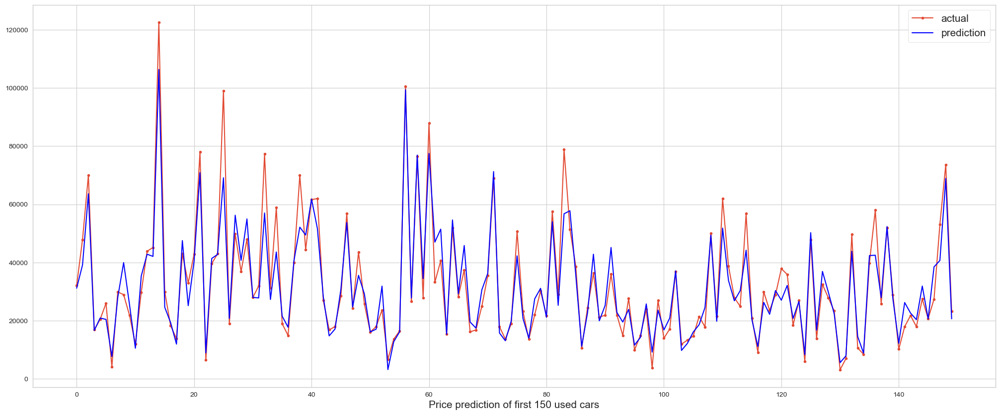

In [136]:
Graph_prediction(150, y_actual, y_predicted)

In [137]:
compare = pd.DataFrame({'Prediction': y_predicted, 'Test Data' : y_actual, 'Abs error': abs(y_actual - y_predicted), 'AAD%': abs(y_actual - y_predicted)/y_actual*100})
compare.head(10)

,Prediction,Test Data,Abs error,AAD%
0,31191.631330,32203,1011.368670,3.140604
1,39175.454468,47890,8714.545532,18.197005
2,63640.437178,69990,6349.562822,9.072100
3,16677.346504,16890,212.653496,1.259050
4,20949.818619,20500,449.818619,2.194237
5,20474.267849,25990,5515.732151,21.222517
6,7707.384998,4250,3457.384998,81.350235
7,28004.347843,29900,1895.652157,6.339974
8,39985.300393,28980,11005.300393,37.975502
9,25564.682533,21900,3664.682533,16.733710


## Finally

In [227]:
model = RandomForestRegressor(random_state=21, n_estimators=5000)
feature1 = ['model', 'transmission', 'fuelType', 'year', 'milage']

X0 = res_data[feature1]
X, y = Definedata()
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.25, random_state = 25)
model.fit(X_train,y_train)
y_predicted = model.predict(X0)

submission = pd.DataFrame({'Car_id': res_data.index,'predicted_price':y_predicted, 'actual_price':train_data.price}) 
submission.head(10)

,Car_id,predicted_price,actual_price
0,0,46558.422400,47990
1,1,31123.816833,34900
2,2,81509.279074,69900
3,3,23195.413200,22490
4,4,29717.346117,20990
5,5,28990.034714,29780
6,6,62483.521642,72900
8,8,20033.938221,17990
9,9,22883.944800,17890
10,10,18927.691610,19490


In [772]:
filename = 'submission.csv'

submission.to_csv(filename,index=True)

print('Saved file: ' + filename)

Saved file: submission.csv
